# **A**ll **S**ummit **I**n a **D**ay (**ASID**) Behavior Analysis Code
### <span style="color: gray;"> v1.3 (June 9th, 2026) - The Merry TOD Thinkin' Update</span>

# Set parameters

**Set your parameters so that the code will run the way you want!** Here *should* be the only place you typically need to edit the code. The parameters here fall into two categories: 
***

1. Parameters that were part of the experiment that you run:
    - ZT0: the time lights turn on (using a 0-24 scale, with 0 as midnight)
    - ontime: how long the lights are on
    - rois: how many rois there were during tracking 
    - infecto: whether any of the flies were infected (1) or not (0)
    - prim_cond: whether there was any non-infection condition (1) or not (0)
    - sec_cond: whether there was a second non-infection condition (1) or not (0)
    - sex_seg: whether you want to sex segregate (1) or not (0)
    - live_cond: whether there was a change in conditions during your experiment or not (0)
        - If there were changes, define them by writing a list of tuples, listing for each: 1. the time in experimental hours that the condition was changed, 2. the time the condition was changed back (if it was never changed back, use 1000), 3. the label for the condition (for the legend of the plots), and 4. the color you want to indicate the change on the graph
        - For example, if you changed the temperature to 30°C for 24 hours starting at ZT0 on the second day of the experiment (the first full day) and then applied methoprene to the board starting at ZT8 on the fourth day of the experiment and it was present until the end, you might write:
            >live_cond = [(24, 48, 'Temperature = 30°C', 'red'), <br>
            &emsp;&emsp;&emsp;&emsp;&emsp;&emsp;(80, 1000, 'Methoprene', 'green')] 
        - Note: due to being related to real time, this will only be displayed on the circadian graph, not the cadaver graph 

***
2. Parameters that determine the output of the code:
    - cisem: whether you want your plots to have error bars with the standard error of the mean (0) or 95% confidence intervals (1)
    - downsamp: the # of data points to downsample when plotting (higher values generally make graphs more readable)
    - window: the size of the window for smoothing (also making graphs more readable); units are in frames (experiments should be in 3 frames/second)
    - fileadder: determines how files are loaded into the code; this should only be "Y" if you deliberately modified the code below to add the files; if it isn't "Y", you will be prompted to choose the files
    - plot_thresh: the minimum # of individuals in a group for that group to be plotted (use 0 to plot everything or 1 to plot everything that has any data points)
    - macorpc: whether you are using a mac (0) or a pc (1) computer to run the code (the code won't run if you choose wrong)
    - savefigures: whether you want to save your plots (1) or not (0) (plots will be saved as .png files to the *first* data folder you added)
    - savedata: whether you want to save the data (1) or not (0) (plots will be saved as .parquet files to the *first* data folder you added)
    - custom_legend: whether you want the default detailed legend labels (0), to type your own when prompted (1), or upload a .csv with labels (2); you will also get to set your own colors
    - darkmode: whether you want the plots to be in light mode (0) or dark mode (1)



In [370]:
ZT0 = 1 # what time (0-24, 0 being midnight) do the lights turn on? 
ontime = 12 # how many hours are the lights on? (typically 12 hours)
cisem = 0 # do you want plots with standard error of the mean (0) or confidence intervals (1)?
downsamp = 1000 # how much to downsample (keeping this at ~1000 makes the graphs more readable, but set to 0 to not do it)
window = 10800 # size of window for smoothing (default is an hour [10800 frames], but set to 0 to not do it)
rois = 128 # how many ROIs are there (strongly recommend 128!; if not 128, it will prompt you to enter the rows manually)
fileadder = "Y" # will files be loaded in automatically because the below code was modified ("Y") or will they be loaded in manually by choosing their filepath (anything else)?
infecto = 1 # whether any of the flies were infected (1) or not (0)
prim_cond = 0 # whether there was any non-infection condition (1) or not (0)
sec_cond = 0 # whether there was a second non-infection condition (1) or not (0)
sex_seg = 0 # whether you want to sex segregate (1) or not (0)
live_cond = 0 # whether any conditions were added midway through the experiment (see above for format) or not (0)
plot_thresh = 1 # the minimum number of individuals in a group for that group to be plotted (use 0 to plot everything or 1 to plot everything that has any data points)
macorpc = 0 # whether you are using a mac (0) or a pc (1) computer to run the code
savefigures = 1 # whether you want to save your plots (1) or not (0)
savedata = 0 # whether you want to save the data (1) or not (0)
custom_legend = 0 # whether you want the default detailed legend labels (0), to type your own when prompted (1), or upload a .csv with labels (2); you will also get to set your own colors
darkmode = 0 # whether you want the plots to be in light mode (0) or dark mode (1)


if sec_cond == 1:
    if prim_cond != 1:
        raise Exception("You can't have a secondary condition without a primary condition!")

if rois != 128:
    cutoffs = [0]
    rows = int(input("How many rows do you have? "))
    for i in range(rows):
        cutoffs.append(int(input(f"What is the *LAST* ROI in row {i}? ")))
else: 
    cutoffs = [0,32,64,96,128]

# Load packages and define functions

**Load your packages and the machinery that will allow you to access MARGO data.** Danylo's code does not load in every bit of information from the MARGO file and also will not work, if the MARGO file structure changes (see below).

In [371]:
# load packages - included below are compatible versions of packages that are known to work well for this code
%matplotlib inline
import scipy.io # 1.11.1
import mat73 # 0.62
import random
import hdf5storage #0.1.19
import numpy as np # 1.24.3
import pandas as pd # 2.0.3
import matplotlib.pyplot as plt # 3.7.2 
import matplotlib.colors as mcolors
import scipy.stats as st 
from scipy import signal 
import matplotlib.lines as mlines 
import seaborn as sns # 0.13.2
import os
from tkinter import filedialog
import tkinter as tk
import numba as nb # 0.57.1
from collections import defaultdict
import copy
import h5py

In [372]:
# Danylo's code for loading in Matlab MARGO expmt files (for MATLAB v7.2 files or earlier)
def d_from_expmt_mat_v72(f):
    '''
    Opens a _margoConvert.MAT file f and converts to
    a Python dictionary. Has the same exact fields/
    structure as the 'exmpt' MATLAB struct.
    Note that this conversion just uses hardcoded
    numbering for indexing, so if the order of fields
    changes in the MATLAB struct, update it here too!
    '''
    # load _margoConvert.MAT file
    mat = hdf5storage.loadmat(f)
    # populate dictionary
    expmt_d = {}
    expmt_d['Centroid'] = {'data': mat['expmt'][0][0][0][0]}
    expmt_d['Speed'] = {'data': mat['expmt'][0][1][0][0]}
    expmt_d['parameters'] = {'target_rate': mat['expmt'][0][2][0][0][0][0],
                        'mm_per_pix': mat['expmt'][0][2][0][1][0][0]}
    expmt_d['fLabel'] = mat['expmt'][0][4][0][0]
    expmt_d['ROI'] = {'bounds': mat['expmt'][0][5][0][0]}
    expmt_d['nTracks'] = mat['expmt'][0][6][0][0]
    return expmt_d

# code to deal with files from MATLAB v7.3 or newer
def is_v73_mat(filename):
    return h5py.is_hdf5(filename)

def read_mat(obj, f):
    if isinstance(obj, h5py.Dataset):
        # Dereference MATLAB cell / object references
        if obj.dtype == h5py.ref_dtype:
            return read_mat(f[obj[()]], f)

        arr = np.array(obj)

        # Convert MATLAB char arrays to Python strings
        if arr.dtype.kind in {'U', 'S', 'O', 'i', 'u'} and arr.ndim <= 2:
            # Heuristic: if 1D array of ASCII codes, convert to string
            if np.issubdtype(arr.dtype, np.integer):
                arr = ''.join(chr(c) for c in arr.flatten())
            # otherwise leave numeric arrays as-is
        return arr

    if isinstance(obj, h5py.Group):
        return {k: read_mat(obj[k], f) for k in obj.keys()}

    if isinstance(obj, h5py.Reference):
        return read_mat(f[obj], f)

    return obj



def d_from_expmt_mat_v73(filename):
    with h5py.File(filename, 'r') as f:
        expmt = f['expmt']
        expmt_d = {}
        expmt_d['Centroid'] = {
            'data': read_mat(expmt['Centroid']['data'], f)
        }
        expmt_d['Speed'] = {
            'data': read_mat(expmt['Speed']['data'], f)
        }
        params = expmt['parameters']
        expmt_d['parameters'] = {
            'target_rate': read_mat(params['target_rate'], f),
            'mm_per_pix':  read_mat(params['mm_per_pix'], f)
        }
        expmt_d['fLabel'] = read_mat(expmt['fLabel'], f)
        expmt_d['ROI'] = {
            'bounds': read_mat(expmt['ROI']['bounds'], f)
        }
        expmt_d['nTracks'] = read_mat(expmt['nTracks'], f)

        expmt_d['Speed']['data'] = expmt_d['Speed']['data'].T
        expmt_d['Centroid']['data'] = expmt_d['Centroid']['data'].T
    return expmt_d

def d_from_expmt_mat(filename):
    if h5py.is_hdf5(filename):
        return d_from_expmt_mat_v73(filename)
    else:
        return d_from_expmt_mat_v72(filename)

# Load in files

In [373]:
# adds files, manually or automatically
if fileadder != "Y":
    if macorpc == 0:
        # prompt for number of files to add
        file_num = int(input("How many files are you going to add? "))

        folders = []

        for i in range(file_num):
            # define folders of interest
            folder = filedialog.askdirectory(title="Select folder")
            if folder:  # if not aborted, keep
                folders.append(folder)
            else:
                print("No folder selected. Skipping.")
        
    if macorpc == 1:
        root = tk.Tk()
        # prompt for number of files to add
        file_num = int(input("How many files are you going to add? "))

        folders = []

        for i in range(file_num):
            # define folders of interest
            folder = filedialog.askdirectory(title="Select folder")
            if folder:  # if not aborted, keep
                folders.append(folder)
            else:
                print("No folder selected. Skipping.")
else:
    # NOTE: for Mac computers, use the folder name format in the following example:
    # ['/User/julius/Desktop/09-19-2024-22-00-30__Circadian_examplesummtingrun_1-128_Day1/']
    # For PC computers, use the format in the following example:
    # [r'C:\Desktop\09-19-2024-22-00-30__Circadian_examplesummtingrun_1-128_Day1' + '\\']
    folders = ['/Users/julius/Desktop/Elya Lab Stuff/Elya Behavior Tracking/Data/SUM4/09-07-2023-17-19-03__Circadian_NM_12_Dvir_BoardC5_MF_Emuscae_1-128_Day3/',
               '/Users/julius/Desktop/Elya Lab Stuff/Elya Behavior Tracking/Data/SUM4/09-15-2023-11-44-53__Circadian_NM17_and_friends_BoardC2_MF_Emuscae_1-128_Day3/']

    file_num = len(folders)

In [374]:
# get all data ready and merged
TODs_reduced_all = pd.DataFrame()
TODs_reduced_all_comp = pd.DataFrame()
ypos_row_reduced_all = pd.DataFrame()
ypos_well_reduced_all = pd.DataFrame()
speed_reduced_all = pd.DataFrame()
labeling_frame_all = pd.DataFrame()


# load in the file and the time of deaths
# get the part of the folder name for data file
sections = []
for folder in folders:
    if macorpc == 0:
        last_slash_index = folder.rfind("/")
        second_last_slash_index = folder.rfind("/", 0, last_slash_index)
        section = folder[second_last_slash_index + 1:last_slash_index]
    if macorpc == 1:
        last_slash_index = folder.rfind("\\")
        second_last_slash_index = folder.rfind("\\", 0, last_slash_index)
        section = folder[second_last_slash_index+1 + 0:last_slash_index] # starts index at 0 rather than 1
    sections.append(section)

# find earliest local start time (to align all the trials)
data_dicts = []
times = []
days = []
for file in range(file_num):
    section = sections[file]

    # find the most relevant files
    file_list = set(os.listdir(folders[file]))

    if f"{section}_margoConvert_autodenoise.mat" in file_list:
        if macorpc == 0:
            data_dict = d_from_expmt_mat(folders[file] + f"{section}_margoConvert_autodenoise.mat")
        if macorpc == 1:
            data_dict = d_from_expmt_mat(folders[file]+'/'+section +"_margoConvert_autodenoise.mat") 
    elif f"{section}_margoConvert.mat" in file_list:
        if macorpc == 0:
            data_dict = d_from_expmt_mat(folders[file] + f"{section}_margoConvert.mat")
        if macorpc == 1:
            data_dict = d_from_expmt_mat(folders[file]+'/'+section+"_margoConvert.mat")
    else:
        print("Error: there doesn't seem to be a margoConvert file here!")

    start_time_hr = int(data_dict['fLabel'][11:13])+(int(data_dict['fLabel'][14:16])/60)+int(data_dict['fLabel'][17:19])/(60*60)
    times.append(start_time_hr)
    data_dicts.append(data_dict)
    days.append(int(folders[file][-2:-1]))
start_time_hr = np.min(times)
start_day = np.min(days) # saved for later cadaver plots

for file in range(file_num):
    section = sections[file]

    data_dict = data_dicts[file]

    if macorpc == 0:
        last_slash_index = folders[file].rfind("/")
        second_last_slash_index = folders[file].rfind("/", 0, last_slash_index)
        TODs = pd.read_excel(folders[file] + folders[file][second_last_slash_index + 1:second_last_slash_index+11] + '-survival_data.xlsx')
        TODs = TODs[:rois]
        if custom_legend == 2:
            legend_path = (folders[file] + folders[file][second_last_slash_index + 1:second_last_slash_index+11] + '-legend_labels.csv')
            if os.path.exists(legend_path):
                labeling_frame = pd.read_csv(legend_path)
            else:
                labeling_frame = pd.DataFrame()
        else:
            labeling_frame = pd.DataFrame()
    if macorpc == 1:
        last_slash_index = folders[file].rfind("\\")
        second_last_slash_index = folders[file].rfind("\\", 0, last_slash_index)
        section = folder[second_last_slash_index+1 + 0:last_slash_index] # starts index at 0 rather than 1
        TODs = pd.read_excel(folders[file] + folders[file][second_last_slash_index+1 + 0:second_last_slash_index+11] + '-survival_data.xlsx')
        TODs = TODs[:rois]
        if custom_legend == 2:
            legend_path = (folders[file] + folders[file][second_last_slash_index+1 + 0:second_last_slash_index+11] + '-legend_labels.csv')
            if os.path.exists(legend_path):
                labeling_frame = pd.read_csv(legend_path)
            else:
                labeling_frame = pd.DataFrame()
        else:
            labeling_frame = pd.DataFrame()

    # extract speed, time, and two types of ypos
    # pull out the speed stat
    speed = pd.DataFrame(data_dict['Speed']['data']).T

    # pull out position data from centroids
    reshaped_array = np.concatenate((data_dict['Centroid']['data'][:, 0, :], data_dict['Centroid']['data'][:, 1, :]), axis=1)
    xpos = pd.DataFrame(reshaped_array[:, :rois])
    ypos = pd.DataFrame(reshaped_array[:, rois:])    

    # change ypos to relative values BY AVERAGING BASED ON THE ROW
    # start by getting the min and max value reached by flies in each row
    bound_lower = []
    bound_upper = []
    for i in range(len(cutoffs)-1):
        temp = ypos.iloc[:,cutoffs[i]:cutoffs[i+1]]
        num_repeats = cutoffs[i+1] - cutoffs[i]
        bound_lower.extend([np.min(temp)] * num_repeats)
        bound_upper.extend([np.max(temp)] * num_repeats)
    bound_lower = np.array(bound_lower)
    bound_upper = np.array(bound_upper)

    # perform the operation directly on the DataFrame
    ytemp_values = ypos.values.copy()
    ytemp_values -= bound_lower
    ytemp_values /= (bound_upper-bound_lower)
    ypos_row = pd.DataFrame(ytemp_values)
    ypos_row = ypos_row.T
    ypos_row = 1-ypos_row # must flip 0 and 1 if 1 is supposed to be the top of the well
                          # because higher ypos numbers in MARGO correspond to lower on the board

    # change ypos to relative values BY AVERAGING BASED ON EACH WELL
    # start by getting the min and max value reached by flies in each well
    bound_lower = []
    bound_upper = []
    for i in range(rois):
        temp = ypos.iloc[:,i]
        bound_lower.extend([np.min(temp)])
        bound_upper.extend([np.max(temp)])
    bound_lower = np.array(bound_lower)
    bound_upper = np.array(bound_upper)

    # perform the operation directly on the DataFrame
    ytemp_values = ypos.values.copy()
    ytemp_values -= bound_lower
    ytemp_values /= (bound_upper-bound_lower)
    ypos_well = pd.DataFrame(ytemp_values)
    ypos_well = ypos_well.T
    ypos_well = 1-ypos_well # must flip 0 and 1 if 1 is supposed to be the top of the well
                            # because higher ypos numbers in MARGO correspond to lower on the board

    # drop bad data points
    TODs_reduced = TODs.copy()
    ypos_row_reduced = ypos_row.copy()
    ypos_well_reduced = ypos_well.copy()
    speed_reduced = speed.copy()
    indexes_to_drop = [] 

    for i in range(rois):
        if not pd.isna(TODs["Deets"][i]) or not pd.isna(TODs["Auto_notes"][i]):
            indexes_to_drop.append(i)

    TODs_reduced = TODs_reduced.drop(indexes_to_drop)
    TODs_reduced.reset_index(drop=True, inplace=True)
    ypos_row_reduced = ypos_row_reduced.drop(indexes_to_drop)
    ypos_row_reduced.reset_index(drop=True, inplace=True)
    ypos_well_reduced = ypos_well_reduced.drop(indexes_to_drop)
    ypos_well_reduced.reset_index(drop=True, inplace=True)
    speed_reduced = speed_reduced.drop(indexes_to_drop)
    speed_reduced.reset_index(drop=True, inplace=True)
    
    # replace the NA values for ypos with the ypos immidiately preceding
    for index, row in ypos_row_reduced.iterrows():
        first_valid_index = row.first_valid_index()
        ypos_row_reduced.loc[index, :first_valid_index] = row[first_valid_index]
        ypos_row_reduced.loc[index] = row.ffill()

    for index, row in ypos_well_reduced.iterrows():
        first_valid_index = row.first_valid_index()
        ypos_well_reduced.loc[index, :first_valid_index] = row[first_valid_index]
        ypos_well_reduced.loc[index] = row.ffill()

    # get local time and compare it to the earliest start, add rows to compensate
    start_time_temp = int(data_dict['fLabel'][11:13])+(int(data_dict['fLabel'][14:16])/60)+int(data_dict['fLabel'][17:19])/(60*60)
    time_diff = abs(start_time_hr - start_time_temp)*3*60*60

    if time_diff > 0:
        na_columns = pd.DataFrame(np.nan, index=ypos_row_reduced.index, columns=[f'NA_{i+1}' for i in range(round(time_diff))])

        ypos_well_reduced = pd.concat([na_columns, ypos_well_reduced], axis=1)
        ypos_well_reduced.columns = range(ypos_well_reduced.columns.size)
        ypos_row_reduced = pd.concat([na_columns, ypos_row_reduced], axis=1)
        ypos_row_reduced.columns = range(ypos_row_reduced.columns.size)
        speed_reduced = pd.concat([na_columns, speed_reduced], axis=1)
        speed_reduced.columns = range(speed_reduced.columns.size)

    TOD_reduced_comp = TODs_reduced.copy()
    TOD_reduced_comp['Blind_TOD'] = TOD_reduced_comp['Blind_TOD'] + time_diff    

    # add to the big frames
    TODs_reduced_all = pd.concat([TODs_reduced_all, TODs_reduced])
    TODs_reduced_all_comp = pd.concat([TODs_reduced_all_comp, TOD_reduced_comp])
    ypos_row_reduced_all = pd.concat([ypos_row_reduced_all, ypos_row_reduced])
    ypos_well_reduced_all = pd.concat([ypos_well_reduced_all, ypos_well_reduced])
    speed_reduced_all = pd.concat([speed_reduced_all, speed_reduced])
    labeling_frame_all = pd.concat([labeling_frame_all, labeling_frame])

# reset variable names
TODs_reduced = TODs_reduced_all
ypos_row_reduced = ypos_row_reduced_all
ypos_well_reduced = ypos_well_reduced_all
speed_reduced = speed_reduced_all
labeling_frame = labeling_frame_all

In [375]:
# export all data to the first folder that was added
if savedata == 1:
    if macorpc == 0:
        TODs_reduced.to_csv(folders[0]+'survival_data_TODs_reduced.csv', index=False)
        np.savez_compressed(folders[0]+'reduced_data.npz', ypos_row=ypos_row_reduced.values, ypos_well=ypos_well_reduced.values, speed=speed_reduced.values)
    if macorpc == 1: 
        TODs_reduced.to_csv(folders[0]+'/'+'survival_data_TODs_reduced.csv', index=False)
        np.savez_compressed(folders[0]+'/'+'reduced_data.npz', ypos_row=ypos_row_reduced.values, ypos_well=ypos_well_reduced.values, speed=speed_reduced.values)
        
# this data can be read back in using NumPy. for example: 
    # reduced_data = np.load('reduced_data.npz')
# you can then pull out specific frames. for example:
    # speed_reduced = pd.DataFrame(reduced_data['speed'])

# Make overall circadian trial graph

In [376]:
# functions to smooth curves out
def smooth(x): # without downsampling
    if window == 0:
        return x
    else:
        temp = pd.DataFrame(x).rolling(min_periods=1, window=window,axis=0).mean()
        return temp

def smoother(x): # with downsampling
    if window == 0:
        return x
    else:
        temp = pd.DataFrame(x).rolling(min_periods=1, window=window,axis=0).mean()
        temp2 = pd.DataFrame(signal.decimate(temp, downsamp,axis=0))
        return temp2

In [377]:
# function to calculate metrics (speed, ypos) for each infection group (alive, cadavers, and uninfected),
# for each group in the primary condition, and for each group in the secondary condition. Which groups
# are used depend on the variables: infecto, prim_cond, and sec_cond 

def get_average(metric_reduced, TODs_reduced, correction, smoothorsmoother, infecto, prim_cond, sec_cond):
    # initialize dictionary to store the results
    results = {}

    # define the groups if there was an infection
    if infecto == 1:
        groups = {
            'uninfected': TODs_reduced['Rx'] == 'Uninfected',
            'cadaver': (TODs_reduced['Status'] == 0) & (TODs_reduced['Rx'] != 'Uninfected'),
            'alive': (TODs_reduced['Status'] == 1) & (TODs_reduced['Rx'] != 'Uninfected')
        }
    else:
        groups = {'all': np.ones(len(TODs_reduced), dtype=bool)}  # No separation by group, use all data

    # get unique conditions and secondary conditions, if needed
    genotypes = TODs_reduced['Geno'].unique()
    
    if prim_cond == 1:
        conditions = TODs_reduced['Condition'].unique()
    else:
        conditions = [None]  # no separation by primary condition, use all data

    if sec_cond == 1:
        secondary_conditions = TODs_reduced['Condition_alt'].unique()
    else:
        secondary_conditions = [None]  # no separation by secondary condition, use all data
        
    if sex_seg == 1:
        sexes = TODs_reduced['Sex'].unique()
    else:
        sexes = [None]  # no separation by secondary condition, use all data

    # loop through each group
    for group_name, group_mask in groups.items():
        # initialize a dictionary for the current group
        results[group_name] = {}

        # loop through each genotype
        for genotype in genotypes:
            if genotype is not None:
                genotype_mask = TODs_reduced['Geno'] == genotype
            else:
                genotype_mask = np.ones(len(TODs_reduced), dtype=bool)  # No separation by genotype
            
            results[group_name][genotype] = {}
            
            for sex in sexes:
                if sex is not None:
                    sex_mask = TODs_reduced['Sex'] == sex
                else:
                    sex_mask = {'all sexes': np.ones(len(TODs_reduced), dtype=bool)}  # No separation by sex
            
                results[group_name][genotype][sex] = {}
            
                # loop through each condition
                for condition in conditions:
                    if condition is not None:
                        condition_mask = TODs_reduced['Condition'] == condition
                    else:
                        condition_mask = np.ones(len(TODs_reduced), dtype=bool)  # No separation by condition

                    if prim_cond == 1:
                        results[group_name][genotype][sex][condition] = {}
                    else:
                        results[group_name][genotype][sex] = {}

                    # loop through each secondary condition
                    for sec_condition in secondary_conditions:
                        if sec_condition is not None:
                            sec_condition_mask = TODs_reduced['Condition_alt'] == sec_condition
                        else:
                            sec_condition_mask = np.ones(len(TODs_reduced), dtype=bool)  # No separation by secondary condition

                        # combine masks to filter data
                        combined_mask = group_mask & genotype_mask & sex_mask & condition_mask & sec_condition_mask

                        # filter the data
                        filtered_data = metric_reduced.values[combined_mask]

                        # calculate metrics
                        dist, sem, lower_bound, upper_bound = calculate_metrics(filtered_data, correction, smoothorsmoother)

                        # store results based on the separation level
                        if prim_cond == 1 and sec_cond == 1:
                            results[group_name][genotype][sex][condition][sec_condition] = {
                                'data': filtered_data,
                                'dist': dist,
                                'sem': sem,
                                'lower_bounds': lower_bound,
                                'upper_bounds': upper_bound
                            }
                        elif prim_cond == 1:
                            results[group_name][genotype][sex][condition] = {
                                'data': filtered_data,
                                'dist': dist,
                                'sem': sem,
                                'lower_bounds': lower_bound,
                                'upper_bounds': upper_bound
                            }
                        else:
                            results[group_name][genotype][sex] = {
                                'data': filtered_data,
                                'dist': dist,
                                'sem': sem,
                                'lower_bounds': lower_bound,
                                'upper_bounds': upper_bound
                            }

    # return the dictionary containing all results
    return results

# this is the metrics finding function contained in the above function
def calculate_metrics(data, correction, smoothorsmoother):
    # calculate mean
    dist = np.nanmean(data, axis=0) * correction
    
    # calculate standard error
    sem = fast_nansem(data)
    sem = sem * correction

    # calculate confidence intervals or standard error bounds
    if cisem == 0:
        lower_bound = dist - sem
        upper_bound = dist + sem
    elif cisem == 1:
        z = st.norm.ppf(0.975)  # 0.975 corresponds to 0.95 in a two-tailed test
        lower_bound = dist - z * sem
        upper_bound = dist + z * sem
    else:
        raise ValueError("cisem should be 0 or 1")

    # apply smoothing if required
    if smoothorsmoother == 0:
        dist = smooth(dist)
        lower_bound = smooth(lower_bound)
        upper_bound = smooth(upper_bound)
    elif smoothorsmoother == 1:
        dist = smoother(dist)
        lower_bound = smoother(lower_bound)
        upper_bound = smoother(upper_bound)

    return dist, sem, lower_bound, upper_bound


In [378]:
# code for calculating SEM fast and efficiently
@nb.njit
def fast_nansem(arr):
    n_rows, n_cols = arr.shape
    sem = np.empty(n_cols)
    
    for col in range(n_cols):
        count = 0
        total = 0.0
        total_sq = 0.0
        
        for row in range(n_rows):
            val = arr[row, col]
            if not np.isnan(val):
                count += 1
                total += val
                total_sq += val * val
        
        if count > 1:
            mean = total / count
            variance = (total_sq - count * mean * mean) / (count - 1)
            sem[col] = np.sqrt(variance) / np.sqrt(count)
        else:
            sem[col] = np.nan
    return sem

In [379]:
# calculate all metrics for all groups
results_ypos_row = get_average(ypos_row_reduced, TODs_reduced, 1, 0, infecto, prim_cond, sec_cond)
results_ypos_well = get_average(ypos_well_reduced, TODs_reduced, 1, 0, infecto, prim_cond, sec_cond)
results_speed = get_average(speed_reduced, TODs_reduced, 0.31*3, 0, infecto, prim_cond, sec_cond)


/var/folders/fw/py2jk1fx4j55fggqc4z4rx0m0000gn/T/ipykernel_1915/3246105374.py:119: RuntimeWarning: Mean of empty slice
  dist = np.nanmean(data, axis=0) * correction
/var/folders/fw/py2jk1fx4j55fggqc4z4rx0m0000gn/T/ipykernel_1915/3246105374.py:119: RuntimeWarning: Mean of empty slice
  dist = np.nanmean(data, axis=0) * correction


In [380]:
# function for plotting with multiple conditions
label_made = 0 # make sure the variable is ready
def plot_data(ax, results, plot_thresh,cad=0):
    global label_made
    global label_maker
    
    if custom_legend == 1 and label_made == 0:
        label_maker = pd.DataFrame(columns=["OldName", "CustomName", "LineColor"]) 
        label_made = 1 # flip this switch so the variable isn't overwritten

    if custom_legend == 2 and label_made == 0:
        label_maker = labeling_frame.copy()
        label_made = 1 # flip this switch so the variable isn't overwritten
    
    femalenum = -1 # variables for sex segregation
    malenum = -1 # variables for sex segregation
    colorgroup = sns.color_palette(palette='tab20').as_hex()
    for colorlonger in range(3):
        colorgroup = colorgroup + sns.color_palette(palette='tab20').as_hex()[1:]
    for group_name, group_data in results.items():
        for geno_name, geno_data in group_data.items():
            for sex_name, sex_data in geno_data.items():
                if list(results[group_name][geno_name][sex_name].keys())[0] != 'data':   
                    for condition, cond_data in sex_data.items():
                        if list(results[group_name][geno_name][sex_name][condition].keys())[0] != 'data':
                            for sec_condition, sec_data in cond_data.items():
                                if sex_seg == 1:
                                    if sex_name == "F":
                                        femalenum = femalenum + 1
                                        if plot_thresh <= len(sec_data['data'])  and (cad != 2 or group_name == 'cadaver'):
                                            # plot each separation level
                                            if cad == 0:
                                                time_array = np.linspace(start_time_hr, (len(speed_reduced.values[0])) / (3 * 60 * 60) + start_time_hr, len(results[group_name][geno_name][sex_name][condition][sec_condition]['dist']))
                                            else:
                                                time_array = np.flip(np.linspace(0, (len(speed_reduced.values[0])) / (3 * 60 * 60) + 0, len(results[group_name][geno_name][sex_name][condition][sec_condition]['dist'])))
                                            time_array_simple, dist_simple, lower_simple, upper_simple = downsamp_plot(time_array,sec_data)
                                            if custom_legend == 1 or custom_legend == 2:
                                                masked = label_maker["OldName"] == f"{group_name} - {geno_name} - {sex_name} - {condition} - {sec_condition}"
                                                if masked.any():  # check if there's at least one match
                                                    labeler = label_maker.loc[masked, "CustomName"].iloc[0]
                                                    colorer = label_maker.loc[masked, "LineColor"].iloc[0]
                                                    ax.plot(time_array_simple, dist_simple, "--", c=colorer, label=f'{labeler} (n={len(sec_data["data"])})')
                                                else:
                                                    labeler = input(f"What would you call this?: {group_name} - {geno_name} - {sex_name} - {condition} - {sec_condition} ")
                                                    colorer = get_valid_color("And what should the color be? ")
                                                    label_maker = pd.concat([label_maker, pd.DataFrame([{"OldName": f'{group_name} - {geno_name} - {sex_name} - {condition} - {sec_condition}', "CustomName": labeler, "LineColor": colorer}])], ignore_index=True)
                                                    ax.plot(time_array_simple, dist_simple, "--", c=colorer, label=f'{labeler} (n={len(sec_data["data"])})')
                                            else:
                                                colorer = colorgroup[2*femalenum]
                                                ax.plot(time_array_simple, dist_simple, "--", c=colorer, label=f'{group_name} - {geno_name} - {sex_name} - {condition} - {sec_condition} (n={len(sec_data["data"])})')
                                            ax.fill_between(time_array_simple, lower_simple, upper_simple, color=colorer,alpha=0.1)
                                    if sex_name == "M":
                                        malenum = malenum + 1
                                        if plot_thresh <= len(sec_data['data']) and (cad != 2 or group_name == 'cadaver'):
                                            # plot each separation level
                                            if cad == 0:
                                                time_array = np.linspace(start_time_hr, (len(speed_reduced.values[0])) / (3 * 60 * 60) + start_time_hr, len(results[group_name][geno_name][sex_name][condition][sec_condition]['dist']))
                                            else:
                                                time_array = np.flip(np.linspace(0, (len(speed_reduced.values[0])) / (3 * 60 * 60) + 0, len(results[group_name][geno_name][sex_name][condition][sec_condition]['dist'])))
                                            time_array_simple, dist_simple, lower_simple, upper_simple = downsamp_plot(time_array,sec_data)
                                            if custom_legend == 1 or custom_legend == 2:
                                                masked = label_maker["OldName"] == f"{group_name} - {geno_name} - {sex_name} - {condition} - {sec_condition}"
                                                if masked.any():  # check if there's at least one match
                                                    labeler = label_maker.loc[masked, "CustomName"].iloc[0]
                                                    colorer = label_maker.loc[masked, "LineColor"].iloc[0]
                                                    ax.plot(time_array_simple, dist_simple, c=colorer, label=f'{labeler} (n={len(sec_data["data"])})')
                                                else:
                                                    labeler = input(f"What would you call this?: {group_name} - {geno_name} - {sex_name} - {condition} - {sec_condition} ")
                                                    colorer = get_valid_color("And what should the color be? ")
                                                    label_maker = pd.concat([label_maker, pd.DataFrame([{"OldName": f'{group_name} - {geno_name} - {sex_name} - {condition} - {sec_condition}', "CustomName": labeler, "LineColor": colorer}])], ignore_index=True)
                                                    ax.plot(time_array_simple, dist_simple, c=colorer, label=f'{labeler} (n={len(sec_data["data"])})')
                                            else:
                                                colorer = colorgroup[2*malenum]
                                                ax.plot(time_array_simple, dist_simple, c=colorer, label=f'{group_name} - {geno_name} - {sex_name} - {condition} - {sec_condition} (n={len(sec_data["data"])})')
                                            ax.fill_between(time_array_simple, lower_simple, upper_simple, color=colorer, alpha=0.1)
                                else:
                                    malenum = malenum + 1
                                    if plot_thresh <= len(sec_data['data']) and (cad != 2 or group_name == 'cadaver'):
                                        # plot each separation level
                                        if cad == 0:
                                            time_array = np.linspace(start_time_hr, (len(speed_reduced.values[0])) / (3 * 60 * 60) + start_time_hr, len(results[group_name][geno_name][sex_name][condition][sec_condition]['dist']))
                                        else:
                                            time_array = np.flip(np.linspace(0, (len(speed_reduced.values[0])) / (3 * 60 * 60) + 0, len(results[group_name][geno_name][sex_name][condition][sec_condition]['dist'])))
                                        time_array_simple, dist_simple, lower_simple, upper_simple = downsamp_plot(time_array,sec_data)
                                        if custom_legend == 1 or custom_legend == 2:
                                            masked = label_maker["OldName"] == f"{group_name} - {geno_name} - {sex_name} - {condition} - {sec_condition}"
                                            if masked.any():  # check if there's at least one match
                                                labeler = label_maker.loc[masked, "CustomName"].iloc[0]
                                                colorer = label_maker.loc[masked, "LineColor"].iloc[0]
                                                ax.plot(time_array_simple, dist_simple, c=colorer, label=f'{labeler} (n={len(sec_data["data"])})')
                                            else:
                                                labeler = input(f"What would you call this?: {group_name} - {geno_name} - {sex_name} - {condition} - {sec_condition} ")
                                                colorer = get_valid_color("And what should the color be? ")
                                                label_maker = pd.concat([label_maker, pd.DataFrame([{"OldName": f'{group_name} - {geno_name} - {sex_name} - {condition} - {sec_condition}', "CustomName": labeler, "LineColor": colorer}])], ignore_index=True)
                                                ax.plot(time_array_simple, dist_simple, c=colorer, label=f'{labeler} (n={len(sec_data["data"])})')
                                        else:
                                            colorer = colorgroup[2*malenum]
                                            ax.plot(time_array_simple, dist_simple, c=colorer, label=f'{group_name} - {geno_name} - {sex_name} - {condition} - {sec_condition} (n={len(sec_data["data"])})')
                                        ax.fill_between(time_array_simple, lower_simple, upper_simple, color=colorer, alpha=0.1)
                        else:
                            if sex_seg == 1:
                                if sex_name == "F":
                                    femalenum = femalenum + 1
                                    if plot_thresh <= len(cond_data['data']) and (cad != 2 or group_name == 'cadaver'):
                                        # if no secondary condition, just use condition
                                        if cad == 0:
                                            time_array = np.linspace(start_time_hr, (len(speed_reduced.values[0])) / (3 * 60 * 60) + start_time_hr, len(results[group_name][geno_name][sex_name][condition]['dist']))
                                        else:
                                            time_array = np.flip(np.linspace(0, (len(speed_reduced.values[0])) / (3 * 60 * 60) + 0, len(results[group_name][geno_name][sex_name][condition]['dist'])))
                                        time_array_simple, dist_simple, lower_simple, upper_simple = downsamp_plot(time_array,cond_data)
                                        if custom_legend == 1 or custom_legend == 2:
                                            masked = label_maker["OldName"] == f"{group_name} - {geno_name} - {sex_name} - {condition}"
                                            if masked.any():  # check if there's at least one match
                                                labeler = label_maker.loc[masked, "CustomName"].iloc[0]
                                                colorer = label_maker.loc[masked, "LineColor"].iloc[0]
                                                ax.plot(time_array_simple, dist_simple,"--", c=colorer, label=f'{labeler} (n={len(cond_data["data"])})')
                                            else:
                                                labeler = input(f"What would you call this?: {group_name} - {geno_name} - {sex_name} - {condition} ")
                                                colorer = get_valid_color("And what should the color be? ")
                                                label_maker = pd.concat([label_maker, pd.DataFrame([{"OldName": f'{group_name} - {geno_name} - {sex_name} - {condition}', "CustomName": labeler, "LineColor": colorer}])], ignore_index=True)
                                                ax.plot(time_array_simple, dist_simple,"--", c=colorer, label=f'{labeler} (n={len(cond_data["data"])})')
                                        else:
                                            colorer = colorgroup[2*femalenum]
                                            ax.plot(time_array_simple, dist_simple,"--", c=colorer, label=f'{group_name} - {geno_name} - {sex_name} - {condition} (n={len(cond_data["data"])})')
                                        ax.fill_between(time_array_simple, lower_simple, upper_simple, color=colorer, alpha=0.1)
                                if sex_name == "M":
                                    malenum = malenum + 1
                                    if plot_thresh <= len(cond_data['data']) and (cad != 2 or group_name == 'cadaver'):
                                        # if no secondary condition, just use condition
                                        if cad == 0:
                                            time_array = np.linspace(start_time_hr, (len(speed_reduced.values[0])) / (3 * 60 * 60) + start_time_hr, len(results[group_name][geno_name][sex_name][condition]['dist']))
                                        else:
                                            time_array = np.flip(np.linspace(0, (len(speed_reduced.values[0])) / (3 * 60 * 60) + 0, len(results[group_name][geno_name][sex_name][condition]['dist'])))
                                        time_array_simple, dist_simple, lower_simple, upper_simple = downsamp_plot(time_array,cond_data)
                                        if custom_legend == 1 or custom_legend == 2:
                                            masked = label_maker["OldName"] == f"{group_name} - {geno_name} - {sex_name} - {condition}"
                                            if masked.any():  # check if there's at least one match
                                                labeler = label_maker.loc[masked, "CustomName"].iloc[0]
                                                colorer = label_maker.loc[masked, "LineColor"].iloc[0]
                                                ax.plot(time_array_simple, dist_simple, c=colorer, label=f'{labeler} (n={len(cond_data["data"])})')
                                            else:
                                                labeler = input(f"What would you call this?: {group_name} - {geno_name} - {sex_name} - {condition} ")
                                                colorer = get_valid_color("And what should the color be? ")
                                                label_maker = pd.concat([label_maker, pd.DataFrame([{"OldName": f'{group_name} - {geno_name} - {sex_name} - {condition}', "CustomName": labeler, "LineColor": colorer}])], ignore_index=True)
                                                ax.plot(time_array_simple, dist_simple, c=colorer, label=f'{labeler} (n={len(cond_data["data"])})')
                                        else:
                                            colorer = colorgroup[2*malenum]
                                            ax.plot(time_array_simple, dist_simple, c=colorer, label=f'{group_name} - {geno_name} - {sex_name} - {condition} (n={len(cond_data["data"])})')
                                        ax.fill_between(time_array_simple, lower_simple, upper_simple, color=colorer, alpha=0.1)          
                            else:
                                malenum = malenum + 1
                                if plot_thresh <= len(cond_data['data']) and (cad != 2 or group_name == 'cadaver'):
                                    # if no secondary condition, just use condition
                                    if cad == 0:
                                        time_array = np.linspace(start_time_hr, (len(speed_reduced.values[0])) / (3 * 60 * 60) + start_time_hr, len(results[group_name][geno_name][sex_name][condition]['dist']))
                                    else:
                                        time_array = np.flip(np.linspace(0, (len(speed_reduced.values[0])) / (3 * 60 * 60) + 0, len(results[group_name][geno_name][sex_name][condition]['dist'])))
                                    time_array_simple, dist_simple, lower_simple, upper_simple = downsamp_plot(time_array,cond_data)
                                    if custom_legend == 1 or custom_legend == 2:
                                        masked = label_maker["OldName"] == f"{group_name} - {geno_name} - {sex_name} - {condition}"
                                        if masked.any():  # check if there's at least one match
                                            labeler = label_maker.loc[masked, "CustomName"].iloc[0]
                                            colorer = label_maker.loc[masked, "LineColor"].iloc[0]
                                            ax.plot(time_array_simple, dist_simple, c=colorer, label=f'{labeler} (n={len(cond_data["data"])})')
                                        else:
                                            labeler = input(f"What would you call this?: {group_name} - {geno_name} - {sex_name} - {condition} ")
                                            colorer = get_valid_color("And what should the color be? ")
                                            label_maker = pd.concat([label_maker, pd.DataFrame([{"OldName": f'{group_name} - {geno_name} - {sex_name} - {condition}', "CustomName": labeler, "LineColor": colorer}])], ignore_index=True)
                                            ax.plot(time_array_simple, dist_simple, c=colorer, label=f'{labeler} (n={len(cond_data["data"])})')
                                    else:
                                        colorer = colorgroup[2*malenum]
                                        ax.plot(time_array_simple, dist_simple, c=colorer, label=f'{group_name} - {geno_name} - {sex_name} - {condition} (n={len(cond_data["data"])})')
                                    ax.fill_between(time_array_simple, lower_simple, upper_simple, color = colorer, alpha=0.1)                          
                else:
                    if sex_seg == 1:
                        if sex_name == "F":
                            femalenum = femalenum + 1
                            if plot_thresh <= len(sex_data['data']) and (cad != 2 or group_name == 'cadaver'):
                                # if no primary or secondary conditions, just use infection outcome
                                if cad == 0:
                                    time_array = np.linspace(start_time_hr, (len(speed_reduced.values[0])) / (3 * 60 * 60) + start_time_hr, len(results[group_name][geno_name][sex_name]['dist']))
                                else:
                                    time_array = np.flip(np.linspace(0, (len(speed_reduced.values[0])) / (3 * 60 * 60) + 0, len(results[group_name][geno_name][sex_name]['dist'])))
                                time_array_simple, dist_simple, lower_simple, upper_simple = downsamp_plot(time_array,sex_data)
                                if custom_legend == 1 or custom_legend == 2:
                                    masked = label_maker["OldName"] == f"{group_name} - {geno_name} - {sex_name}"
                                    if masked.any():  # check if there's at least one match
                                        labeler = label_maker.loc[masked, "CustomName"].iloc[0]
                                        colorer = label_maker.loc[masked, "LineColor"].iloc[0]
                                        ax.plot(time_array_simple, dist_simple, "--", c=colorer, label=f'{labeler} (n={len(sex_data["data"])})')
                                    else:
                                        labeler = input(f"What would you call this?: {group_name} - {geno_name} - {sex_name} ")
                                        colorer = get_valid_color("And what should the color be? ")
                                        label_maker = pd.concat([label_maker, pd.DataFrame([{"OldName": f'{group_name} - {geno_name} - {sex_name}', "CustomName": labeler, "LineColor": colorer}])], ignore_index=True)
                                        ax.plot(time_array_simple, dist_simple, "--", c=colorer, label=f'{labeler} (n={len(sex_data["data"])})')
                                else:
                                    colorer = colorgroup[2*femalenum]
                                    ax.plot(time_array_simple, dist_simple, "--", c=colorer, label=f'{group_name} - {geno_name} - {sex_name} (n={len(sex_data["data"])})')
                                ax.fill_between(time_array_simple, lower_simple, upper_simple, color=colorer, alpha=0.1)
                        if sex_name == "M":
                            malenum = malenum + 1
                            if plot_thresh <= len(sex_data['data']) and (cad != 2 or group_name == 'cadaver'):
                                # if no primary or secondary conditions, just use infection outcome
                                if cad == 0:
                                    time_array = np.linspace(start_time_hr, (len(speed_reduced.values[0])) / (3 * 60 * 60) + start_time_hr, len(results[group_name][geno_name][sex_name]['dist']))
                                else:
                                    time_array = np.flip(np.linspace(0, (len(speed_reduced.values[0])) / (3 * 60 * 60) + 0, len(results[group_name][geno_name][sex_name]['dist'])))
                                time_array_simple, dist_simple, lower_simple, upper_simple = downsamp_plot(time_array,sex_data)
                                if custom_legend == 1 or custom_legend == 2:
                                    masked = label_maker["OldName"] == f"{group_name} - {geno_name} - {sex_name}"
                                    if masked.any():  # check if there's at least one match
                                        labeler = label_maker.loc[masked, "CustomName"].iloc[0]
                                        colorer = label_maker.loc[masked, "LineColor"].iloc[0]
                                        ax.plot(time_array_simple, dist_simple, c=colorer, label=f'{labeler} (n={len(sex_data["data"])})')
                                    else:
                                        labeler = input(f"What would you call this?: {group_name} - {geno_name} - {sex_name} ")
                                        colorer = get_valid_color("And what should the color be? ")
                                        label_maker = pd.concat([label_maker, pd.DataFrame([{"OldName": f'{group_name} - {geno_name} - {sex_name}', "CustomName": labeler, "LineColor": colorer}])], ignore_index=True)
                                        ax.plot(time_array_simple, dist_simple, c=colorer, label=f'{labeler} (n={len(sex_data["data"])})')
                                else:
                                    colorer = colorgroup[2*malenum]
                                    ax.plot(time_array_simple, dist_simple, c=colorer, label=f'{group_name} - {geno_name} - {sex_name} (n={len(sex_data["data"])})')
                                ax.fill_between(time_array_simple, lower_simple, upper_simple, color=colorer, alpha=0.1)
                    else:
                        malenum = malenum + 1
                        if plot_thresh <= len(sex_data['data']) and (cad != 2 or group_name == 'cadaver'):
                            # if no primary or secondary conditions, just use infection outcome
                            if cad == 0:
                                time_array = np.linspace(start_time_hr, (len(speed_reduced.values[0])) / (3 * 60 * 60) + start_time_hr, len(results[group_name][geno_name][sex_name]['dist']))
                            else:
                                time_array = np.flip(np.linspace(0, (len(speed_reduced.values[0])) / (3 * 60 * 60) + 0, len(results[group_name][geno_name][sex_name]['dist'])))
                            time_array_simple, dist_simple, lower_simple, upper_simple = downsamp_plot(time_array,sex_data)
                            if custom_legend == 1 or custom_legend == 2:
                                masked = label_maker["OldName"] == f"{group_name} - {geno_name} - {sex_name}"
                                if masked.any():  # check if there's at least one match
                                    labeler = label_maker.loc[masked, "CustomName"].iloc[0]
                                    colorer = label_maker.loc[masked, "LineColor"].iloc[0]
                                    ax.plot(time_array_simple, dist_simple, c=colorer, label=f'{labeler} (n={len(sex_data["data"])})')
                                else:
                                    labeler = input(f"What would you call this?: {group_name} - {geno_name} - {sex_name} ")
                                    colorer = get_valid_color("And what should the color be? ")
                                    label_maker = pd.concat([label_maker, pd.DataFrame([{"OldName": f'{group_name} - {geno_name} - {sex_name}', "CustomName": labeler, "LineColor": colorer}])], ignore_index=True)
                                    ax.plot(time_array_simple, dist_simple, c=colorer, label=f'{labeler} (n={len(sex_data["data"])})')
                            else:
                                colorer = colorgroup[2*malenum]
                                ax.plot(time_array_simple, dist_simple, c=colorer, label=f'{group_name} - {geno_name} - {sex_name} (n={len(sex_data["data"])})')
                            ax.fill_between(time_array_simple, lower_simple, upper_simple, color = colorer, alpha=0.1)

# function to make the code less computationally intensive when plotting large datasets
def downsamp_plot(time_array, data, max_points=500):
    dist = data['dist']
    lower_bounds = data['lower_bounds']
    upper_bounds = data['upper_bounds']
    if len(time_array) > max_points:
        idx = np.linspace(0, len(time_array) - 1, max_points).astype(int)
        time_array_simple = time_array[idx]
        dist_simple = np.array(dist)[idx]
        lower_simple = np.array(lower_bounds).ravel()[idx]
        upper_simple = np.array(upper_bounds).ravel()[idx]
    else:
        time_array_simple = time_array
        dist_simple = dist
        lower_simple = lower_bounds
        upper_simple = upper_bounds
    return time_array_simple, dist_simple, lower_simple, upper_simple

# function to get a valid color
def get_valid_color(prompt="Enter a color: "):
    while True:
        color = input(prompt)
        if mcolors.is_color_like(color):
            return color
        else:
            print(f"'{color}' is not a valid color. Try again.")                                       

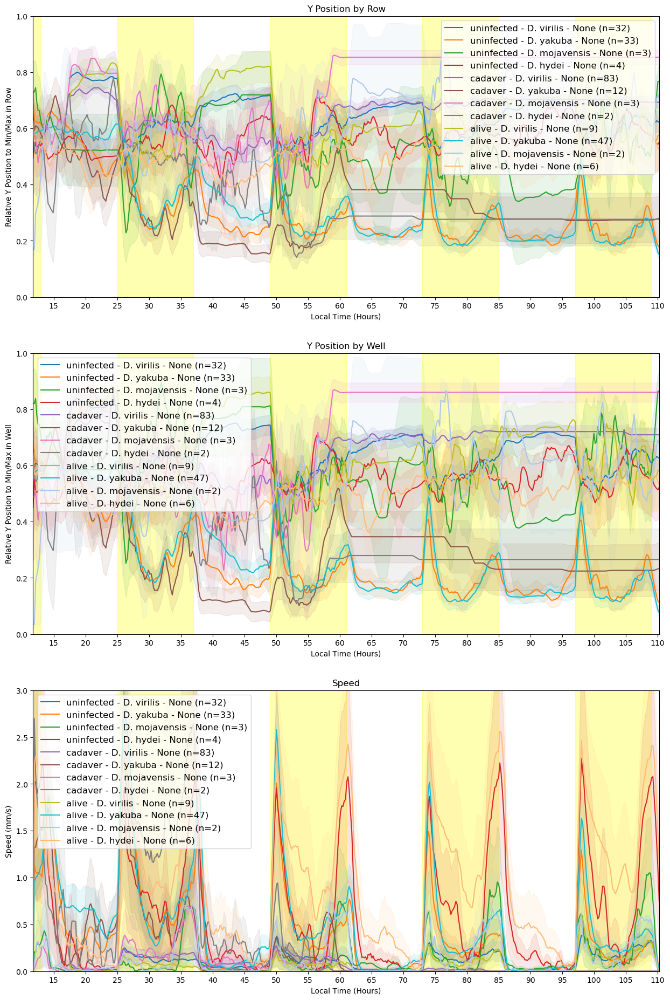

In [381]:
# PLOT WITH MULTIPLE CONDITIONS
if darkmode == 1:
    bg_color = 'black'
    ax_color = 'black'
    text_color = 'white'
    tick_color = 'white'
    spine_color = 'white'
    light_fill = 'lightgray'
    light_alpha = 0.15
    grid_color = 'gray'
else:
    bg_color = 'white'
    ax_color = 'white'
    text_color = 'black'
    tick_color = 'black'
    spine_color = 'black'
    light_fill = 'yellow'
    light_alpha = 0.3
    grid_color = 'lightgray'

# define figure and axes
fig, axs = plt.subplots(3, 1, figsize=(15, 23))
fig.patch.set_facecolor(bg_color)
for ax in axs:
    ax.set_facecolor(ax_color)
    ax.tick_params(colors=tick_color)
    for spine in ax.spines.values():
        spine.set_color(spine_color)
    ax.yaxis.label.set_color(text_color)
    ax.xaxis.label.set_color(text_color)
    ax.title.set_color(text_color)


# define the light cycle
lights_on = []
for i in range(-1, 1 + int(np.ceil((len(speed_reduced.values[0])) / (3 * 60 * 60) / 24))):  # days of the trial
    lights_on.append(ZT0 + 24 * i)
    lights_on.append(ZT0 + ontime + 24 * i)

# fill light cycle in the plots
for i in range(0, len(lights_on), 2):
    if i + 1 < len(lights_on):
        for ax in axs:
            ax.fill_betweenx((-0.1, 4), lights_on[i], lights_on[i + 1], color=light_fill, alpha=light_alpha)

# fill live conditions in the plots (if used)
lower_ylim = 0 # set as normal unless the space is needed for live conditions
if live_cond != 0:
    lower_ylim = -0.1
    for cond in live_cond:
        for ax in axs:
            if ax != axs[2]:    
                ax.fill_betweenx((lower_ylim/3, 0), cond[0], cond[1], color=cond[3], alpha=0.3, label=f'{cond[2]}')
            else:
                ax.fill_betweenx((lower_ylim, 0), cond[0], cond[1], color=cond[3], alpha=0.3, label=f'{cond[2]}')

# plot data for ypos by row
plot_data(axs[0], results_ypos_row, plot_thresh)
axs[0].set_ylabel("Relative Y Position to Min/Max in Row")
axs[0].set_title("Y Position by Row")
axs[0].set_xlabel("Local Time (Hours)")
axs[0].set_xticks(np.arange(0, np.ceil((len(ypos_row_reduced.values[0])) / (3 * 60 * 60) + start_time_hr), 5))
axs[0].set_ylim(lower_ylim/3, 1)
axs[0].set_xlim(start_time_hr, (len(ypos_row_reduced.values[0])) / (3 * 60 * 60) + start_time_hr)
axs[0].legend(prop={"size": 12}, loc="upper right")

# plot data for ypos by well
plot_data(axs[1], results_ypos_well, plot_thresh)
axs[1].set_ylabel("Relative Y Position to Min/Max in Well")
axs[1].set_xlabel("Local Time (Hours)")
axs[1].set_title("Y Position by Well")
axs[1].set_xticks(np.arange(0, np.ceil((len(ypos_well_reduced.values[0])) / (3 * 60 * 60) + start_time_hr), 5))
axs[1].legend(prop={"size": 12}, loc="upper left")
axs[1].set_ylim(lower_ylim/3, 1)
axs[1].set_xlim(start_time_hr, (len(ypos_well_reduced.values[0])) / (3 * 60 * 60) + start_time_hr)

# plot data for speed
plot_data(axs[2], results_speed, plot_thresh)
axs[2].set_ylabel("Speed (mm/s)")
axs[2].set_title("Speed")
axs[2].set_xlabel("Local Time (Hours)")
axs[2].set_xticks(np.arange(0, np.ceil((len(speed_reduced.values[0])) / (3 * 60 * 60) + start_time_hr), 5))
axs[2].legend(prop={"size": 12}, loc="upper left")
axs[2].set_ylim(lower_ylim, 3)
axs[2].set_xlim(start_time_hr, (len(speed_reduced.values[0])) / (3 * 60 * 60) + start_time_hr)

if darkmode == 1:
    for ax in axs:
        leg = ax.get_legend()
        if leg:
            for text in leg.get_texts():
                text.set_color('white')
            leg.get_frame().set_facecolor('black')
            leg.get_frame().set_edgecolor('white') 

if savefigures == 1:
    if sex_seg == 0:
        if macorpc == 0: 
            plt.savefig(folders[0]+"Circadian_plot.png",dpi=300, facecolor=fig.get_facecolor())
        if macorpc == 1: 
            plt.savefig(folders[0]+'/'+"Circadian_plot.png",dpi=300, facecolor=fig.get_facecolor())
    if sex_seg == 1:
        if macorpc == 0:
            plt.savefig(folders[0]+"Circadian_plot_sexseg.png",dpi=300, facecolor=fig.get_facecolor())
        if macorpc == 1: 
            plt.savefig(folders[0]+'/'+"Circadian_plot_sexseg.png",dpi=300, facecolor=fig.get_facecolor())
        
plt.show()


## Optional: plot certain conditions individually

In [382]:
# functions to separate dictionary into component parts, if desired
def collect_paths(d, depth, current_depth=1, path=None):
    if path is None:
        path = []
    results = []
    for k, v in d.items():
        if isinstance(v, dict):
            if current_depth == depth:
                results.append((path + [k], v))
            else:
                results.extend(collect_paths(v, depth, current_depth + 1,
                                             path + [k]))
    return results


def group_by_lower_level_as_list(d, depth):
    grouped = defaultdict(list)
    paths = collect_paths(d, depth)

    for path, val in paths:
        group_key = path[-1]

        # Build dict in *original order*
        rebuilt = {group_key: copy.deepcopy(val)}
        for upper in reversed(path[:-1]):
            rebuilt = {upper: rebuilt}

        grouped[group_key].append(rebuilt)

    # merge fragments under correct original hierarchy
    merged_list = []
    for group_key, fragments in grouped.items():
        merged = {}

        for frag in fragments:
            # recursively merge while preserving key order
            def merge_into(target, source):
                for k, v in source.items():
                    if k not in target:
                        target[k] = {}
                    if isinstance(v, dict):
                        merge_into(target[k], v)
                    else:
                        target[k] = v
            merge_into(merged, frag)

        merged_list.append(merged)

    return merged_list

# function for labeling output plots
def nth_nested_key(d, n):
    for _ in range(n-1):
        d = d[next(iter(d))]
    return next(iter(d))


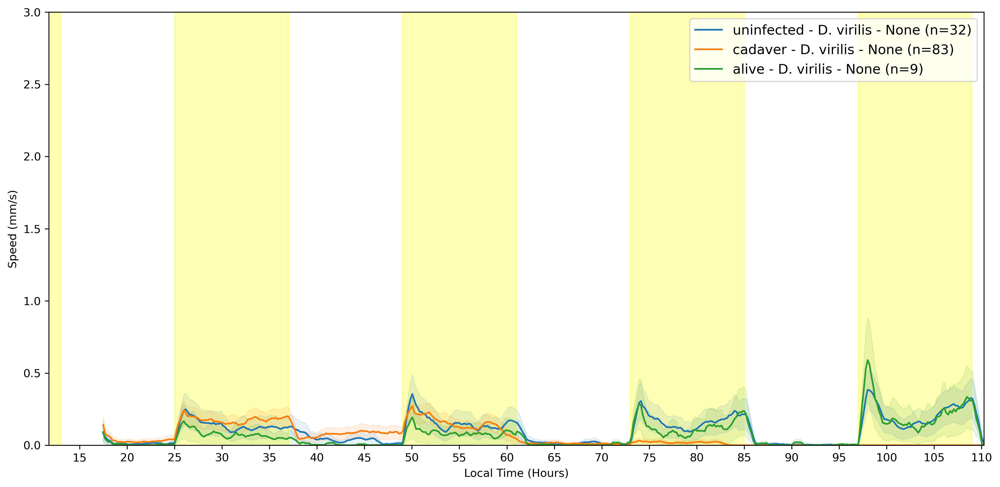

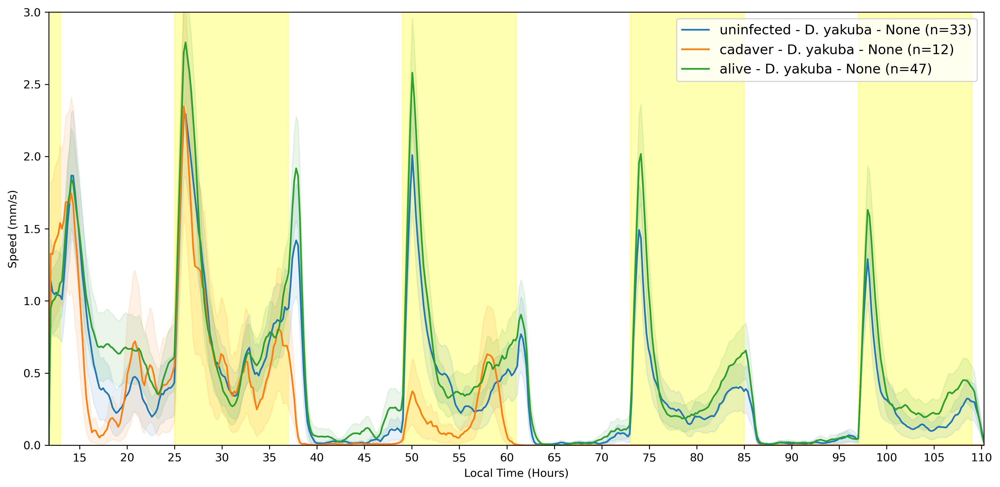

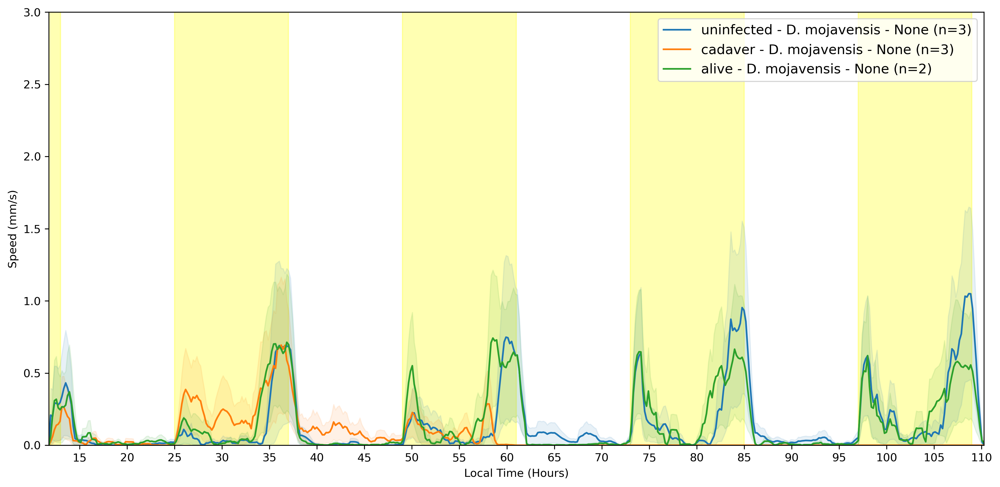

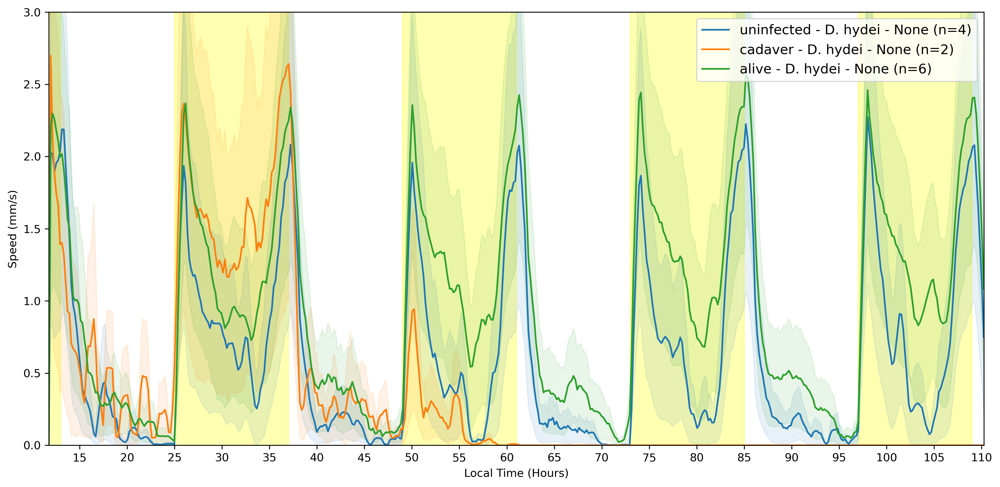

In [383]:
# plot each group (AS DEFINED BY THE USER!) individually
depth = int(input("What variable do you want to split your graph up by?\n1: Infection Status\n2: Genotype\n3: Sex\n4: Primary Condition (if applicable)\n5: Secondary Condition (if applicable)\n"))
what_to_plot = int(input("What variable(s) do you want to plot?\n1: Speed\n2: Ypos (by row)\n3: Ypos (by well)\n4: All three\n"))

sectioned_ypos_row = group_by_lower_level_as_list(results_ypos_row, depth)
sectioned_ypos_well = group_by_lower_level_as_list(results_ypos_well, depth)
sectioned_speed = group_by_lower_level_as_list(results_speed, depth)

for split in range(len(sectioned_speed)):
    # define figure and axes
    if what_to_plot == 4:
        fig, axs = plt.subplots(3, 1, figsize=(15, 23))
    else:
        fig, axs = plt.subplots(1, 1, figsize=(15, 7),dpi=300)
        if not isinstance(axs, np.ndarray):
            axs = np.array([axs])

    # set the graph colors
    fig.patch.set_facecolor(bg_color)
    for ax in axs:
        ax.set_facecolor(ax_color)
        ax.tick_params(colors=tick_color)
        for spine in ax.spines.values():
            spine.set_color(spine_color)
        ax.yaxis.label.set_color(text_color)
        ax.xaxis.label.set_color(text_color)
        ax.title.set_color(text_color)
        
    # define the light cycle
    lights_on = []
    for i in range(-1, 1 + int(np.ceil((len(speed_reduced.values[0])) / (3 * 60 * 60) / 24))):  # days of the trial
        lights_on.append(ZT0 + 24 * i)
        lights_on.append(ZT0 + ontime + 24 * i)

    # fill light cycle in the plots
    for i in range(0, len(lights_on), 2):
        if i + 1 < len(lights_on):
            for ax in axs:
                ax.fill_betweenx((-0.1, 9), lights_on[i], lights_on[i + 1], color=light_fill, alpha=light_alpha)

    # fill live conditions in the plots (if used)
    lower_ylim = 0 # set as normal unless the space is needed for live conditions
    if live_cond != 0:
        lower_ylim = -0.1
        for cond in live_cond:
            if what_to_plot == 4:
                for ax in axs:
                    if ax != axs[2]:    
                        ax.fill_betweenx((lower_ylim/3, 0), cond[0], cond[1], color=cond[3], alpha=0.3, label=f'{cond[2]}')
                    else:
                        ax.fill_betweenx((lower_ylim, 0), cond[0], cond[1], color=cond[3], alpha=0.3, label=f'{cond[2]}')
            if what_to_plot == 1:
                for ax in axs:
                    ax.fill_betweenx((lower_ylim, 0), cond[0], cond[1], color=cond[3], alpha=0.3, label=f'{cond[2]}')
            if what_to_plot == 2 or what_to_plot == 3:
                for ax in axs:
                    ax.fill_betweenx((lower_ylim/3, 0), cond[0], cond[1], color=cond[3], alpha=0.3, label=f'{cond[2]}')

    if what_to_plot == 1:
        # plot data for speed
        plot_data(axs[0], sectioned_speed[split], plot_thresh)
        axs[0].set_ylabel("Speed (mm/s)")
        #axs[0].set_title("Speed")
        axs[0].set_xlabel("Local Time (Hours)")
        axs[0].set_xticks(np.arange(0, np.ceil((len(speed_reduced.values[0])) / (3 * 60 * 60) + start_time_hr), 5))
        axs[0].legend(prop={"size": 12}, loc="upper right")
        axs[0].set_ylim(lower_ylim, 3)
        axs[0].set_xlim(start_time_hr, (len(speed_reduced.values[0])) / (3 * 60 * 60) + start_time_hr)

        if darkmode == 1:
            for ax in axs:
                leg = ax.get_legend()
                if leg:
                    for text in leg.get_texts():
                        text.set_color('white')
                    leg.get_frame().set_facecolor('black')
                    leg.get_frame().set_edgecolor('white') 

        if savefigures == 1:
            if macorpc == 0:
                plt.savefig(folders[0]+f"{nth_nested_key(sectioned_speed[split], depth)}_Circadian_Speed_plot.png",dpi=300)
            if macorpc == 1: 
                plt.savefig(folders[0]+'/'+f"{nth_nested_key(sectioned_speed[split], depth)}_Circadian_Speed_plot.png",dpi=300)

        plt.show()
    if what_to_plot == 2:
        # plot data for ypos by row
        plot_data(axs[0], sectioned_ypos_row[split], plot_thresh)
        axs[0].set_ylabel("Relative Y Position to Min/Max in Row")
        axs[0].set_title("Y Position by Row")
        axs[0].set_xlabel("Local Time (Hours)")
        axs[0].set_xticks(np.arange(0, np.ceil((len(ypos_row_reduced.values[0])) / (3 * 60 * 60) + start_time_hr), 5))
        axs[0].legend(prop={"size": 12}, loc="upper right")
        axs[0].set_ylim(lower_ylim/3, 1)
        axs[0].set_xlim(start_time_hr, (len(ypos_row_reduced.values[0])) / (3 * 60 * 60) + start_time_hr)
        
        if darkmode == 1:
            for ax in axs:
                leg = ax.get_legend()
                if leg:
                    for text in leg.get_texts():
                        text.set_color('white')
                    leg.get_frame().set_facecolor('black')
                    leg.get_frame().set_edgecolor('white') 

        if savefigures == 1:
            if macorpc == 0:
                plt.savefig(folders[0]+f"{nth_nested_key(sectioned_speed[split], depth)}_Circadian_Yposrow_plot.png",dpi=300)
            if macorpc == 1: 
                plt.savefig(folders[0]+'/'+f"{nth_nested_key(sectioned_speed[split], depth)}_Circadian_Yposrow_plot.png",dpi=300)

        plt.show()
    if what_to_plot == 3:
        # plot data for ypos by well
        plot_data(axs[0], sectioned_ypos_well[split], plot_thresh)
        axs[0].set_ylabel("Relative Y Position to Min/Max in Well")
        axs[0].set_title("Y Position by Well")
        axs[0].set_xlabel("Local Time (Hours)")
        axs[0].set_xticks(np.arange(0, np.ceil((len(ypos_well_reduced.values[0])) / (3 * 60 * 60) + start_time_hr), 5))
        axs[0].legend(prop={"size": 12}, loc="upper right")
        axs[0].set_ylim(lower_ylim/3, 1)
        axs[0].set_xlim(start_time_hr, (len(ypos_well_reduced.values[0])) / (3 * 60 * 60) + start_time_hr)

        if darkmode == 1:
            for ax in axs:
                leg = ax.get_legend()
                if leg:
                    for text in leg.get_texts():
                        text.set_color('white')
                    leg.get_frame().set_facecolor('black')
                    leg.get_frame().set_edgecolor('white') 

        if savefigures == 1:
            if macorpc == 0:
                plt.savefig(folders[0]+f"{nth_nested_key(sectioned_speed[split], depth)}_Circadian_Yposwell_plot.png",dpi=300)
            if macorpc == 1: 
                plt.savefig(folders[0]+'/'+f"{nth_nested_key(sectioned_speed[split], depth)}_Circadian_Yposwell_plot.png",dpi=300)

        plt.show()
    if what_to_plot == 4:
        # plot data for ypos by row
        plot_data(axs[0], sectioned_ypos_row[split], plot_thresh)
        axs[0].set_ylabel("Relative Y Position to Min/Max in Row")
        axs[0].set_title("Y Position by Row")
        axs[0].set_xlabel("Local Time (Hours)")
        axs[0].set_xticks(np.arange(0, np.ceil((len(ypos_row_reduced.values[0])) / (3 * 60 * 60) + start_time_hr), 5))
        axs[0].legend(prop={"size": 12}, loc="upper right")
        axs[0].set_ylim(lower_ylim/3, 1)
        axs[0].set_xlim(start_time_hr, (len(ypos_row_reduced.values[0])) / (3 * 60 * 60) + start_time_hr)

        # plot data for ypos by well
        plot_data(axs[1], sectioned_ypos_well[split], plot_thresh)
        axs[1].set_ylabel("Relative Y Position to Min/Max in Well")
        axs[1].set_xlabel("Local Time (Hours)")
        axs[1].set_title("Y Position by Well")
        axs[1].set_xticks(np.arange(0, np.ceil((len(ypos_well_reduced.values[0])) / (3 * 60 * 60) + start_time_hr), 5))
        axs[1].legend(prop={"size": 12}, loc="upper left")
        axs[1].set_ylim(lower_ylim/3, 1)
        axs[1].set_xlim(start_time_hr, (len(ypos_well_reduced.values[0])) / (3 * 60 * 60) + start_time_hr)

        # plot data for speed
        plot_data(axs[2], sectioned_speed[split], plot_thresh)
        axs[2].set_ylabel("Speed (mm/s)")
        axs[2].set_title("Speed")
        axs[2].set_xlabel("Local Time (Hours)")
        axs[2].set_xticks(np.arange(0, np.ceil((len(speed_reduced.values[0])) / (3 * 60 * 60) + start_time_hr), 5))
        axs[2].legend(prop={"size": 12}, loc="upper left")
        axs[2].set_ylim(lower_ylim, 4)
        axs[2].set_xlim(start_time_hr, (len(speed_reduced.values[0])) / (3 * 60 * 60) + start_time_hr)

        if darkmode == 1:
            for ax in axs:
                leg = ax.get_legend()
                if leg:
                    for text in leg.get_texts():
                        text.set_color('white')
                    leg.get_frame().set_facecolor('black')
                    leg.get_frame().set_edgecolor('white') 

        if savefigures == 1:
            if macorpc == 0:
                plt.savefig(folders[0]+f"{nth_nested_key(sectioned_speed[split], depth)}_Circadian_plot.png",dpi=300)
            if macorpc == 1: 
                plt.savefig(folders[0]+'/'+f"{nth_nested_key(sectioned_speed[split], depth)}_Circadian_plot.png",dpi=300)

        plt.show()


# Make cadaver graph

In [384]:
# function to align cadaver data by TOD and living flies by mock TOD 
def align(metric_reduced, TODs_reduced, infecto, prim_cond, sec_cond):
    # Initialize dictionary to store the results
    results = {}

    # Define groups based on infecto
    if infecto == 1:
        groups = {
            'uninfected': TODs_reduced['Rx'] == 'Uninfected',
            'cadaver': (TODs_reduced['Status'] == 0) & (TODs_reduced['Rx'] != 'Uninfected'),
            'alive': (TODs_reduced['Status'] == 1)  & (TODs_reduced['Rx'] != 'Uninfected')
        }
    else:
        groups = {'all': np.ones(len(TODs_reduced), dtype=bool)}  # No separation by group, use all data

    # Predefine cadaver data for reference
    cadavers_only_metric = metric_reduced[(TODs_reduced['Status'] == 0) & (TODs_reduced['Rx'] != 'Uninfected')].reset_index(drop=True)
    cadavers_only_TODs = TODs_reduced[(TODs_reduced['Status'] == 0) & (TODs_reduced['Rx'] != 'Uninfected')].reset_index(drop=True)
    
    # Determine the maximum number of columns needed in the result frame based on cadaver data
    if len(cadavers_only_TODs) > 0:
        columns_range = range(max(int(tod) + 1 for tod in cadavers_only_TODs["Blind_TOD"]) - 1, -1, -1)
        max_columns = max(cadavers_only_metric.columns.get_loc(round(tod)) + 1 for tod in cadavers_only_TODs["Blind_TOD"])
    else:
        columns_range = range(0)
        max_columns = 0

    # Loop through each group
    for group_name, group_mask in groups.items():
        # Initialize a dictionary for the current group
        results[group_name] = {}

        # Further group by Geno
        geno_types = TODs_reduced['Geno'].unique()

        for geno in geno_types:
            geno_mask = TODs_reduced['Geno'] == geno

            # Initialize dictionary for the current Geno group
            results[group_name][geno] = {}
            
            # Further group by sex
            if sex_seg == 1:
                sexes = TODs_reduced['Sex'].unique()
            else:
                sexes = [None]  # no separation by secondary condition, use all data

            for sex in sexes:
                if sex is not None:
                    sex_mask = TODs_reduced['Sex'] == sex
                else:
                    sex_mask = {'all sexes': np.ones(len(TODs_reduced), dtype=bool)}  # No separation by sex

                if prim_cond == 1:
                    conditions = TODs_reduced['Condition'].unique()
                else:
                    conditions = [None]  # No separation by primary condition, use all data

                # Initialize dictionary for the current sex group
                results[group_name][geno][sex] = {}

                # Loop through each condition
                for condition in conditions:
                    if condition is not None:
                        condition_mask = TODs_reduced['Condition'] == condition
                    else:
                        condition_mask = np.ones(len(TODs_reduced), dtype=bool)  # No separation by condition

                    if sec_cond == 1:
                        secondary_conditions = TODs_reduced['Condition_alt'].unique()
                    else:
                        secondary_conditions = [None]  # No separation by secondary condition, use all data

                    results[group_name][geno][sex][condition] = {}

                    # Loop through each secondary condition
                    for sec_condition in secondary_conditions:
                        if sec_condition is not None:
                            sec_condition_mask = TODs_reduced['Condition_alt'] == sec_condition
                        else:
                            sec_condition_mask = np.ones(len(TODs_reduced), dtype=bool)  # No separation by secondary condition

                        # Combine masks to filter data
                        combined_mask = group_mask & geno_mask & sex_mask & condition_mask & sec_condition_mask

                        # Create a new DataFrame to store the aligned results
                        #result_df = pd.DataFrame(columns=range(max_columns-1, -1, -1))
                        result_df = []

                        if group_name == 'uninfected' or group_name == 'alive':
                            data_metric = metric_reduced[combined_mask]
                            data_metric = data_metric.values
                            data_TODs = TODs_reduced[combined_mask]

                            # Align live data based on mock TODs
                            random.seed(10)  # Set seed for reproducibility
                            for index, ROI in enumerate(data_TODs["ROI"]):
                                if max_columns > 0:
                                    tod_index = cadavers_only_metric.columns.get_loc(random.choice(list(TODs_reduced["Blind_TOD"].nlargest(2))))
                                    individual_metric = data_metric[index, :tod_index + 1]
                                    reversed_metric = individual_metric[::-1]
                                    result_series = pd.Series(reversed_metric, index=range(tod_index+1))
                                    padded_metric = np.pad(reversed_metric, (0, max(int(tod) + 1 for tod in cadavers_only_TODs["Blind_TOD"]) - len(reversed_metric)), 'constant', constant_values=np.nan)
                                    rereversed_metric = padded_metric[::-1]
                                    result_df.append(rereversed_metric)
                                    #result_df.loc[len(cadavers_only_TODs) + index] = result_series

                        if group_name == 'cadaver':
                            data_metric = metric_reduced[combined_mask]
                            data_metric = data_metric.values
                            data_TODs = TODs_reduced[combined_mask]

                            # Align cadaver data using predefined cadavers_only_metric and cadavers_only_TODs
                            for index, tod in enumerate(data_TODs["Blind_TOD"]):
                                tod_index = int(tod)
                                individual_metric = data_metric[index, :tod_index + 1]
                                reversed_metric = individual_metric[::-1]
                                padded_metric = np.pad(reversed_metric, (0, max(int(tod) + 1 for tod in cadavers_only_TODs["Blind_TOD"]) - len(reversed_metric)), 'constant', constant_values=np.nan)
                                rereversed_metric = padded_metric[::-1]
                                result_df.append(rereversed_metric)
                        
                        if len(result_df) > 0:
                            result_array = np.vstack(result_df)
                            result_df = pd.DataFrame(result_array, columns=columns_range)
                        else:
                            result_df = pd.DataFrame()

                        # Store the aligned DataFrame for the current combination
                        results[group_name][geno][sex][condition][sec_condition] = result_df

    return results


In [385]:
# use the alignment code
aligned_speed = align(speed_reduced, TODs_reduced_all_comp, infecto, prim_cond, sec_cond)
aligned_ypos_well = align(ypos_well_reduced, TODs_reduced_all_comp, infecto, prim_cond, sec_cond)
aligned_ypos_row = align(ypos_row_reduced, TODs_reduced_all_comp, infecto, prim_cond, sec_cond)

In [386]:
# export all aligned data to the first folder that was added
if savedata == 1:
    if macorpc == 0:
        np.savez_compressed(folders[0]+'aligned_data.npz', ypos_row=aligned_ypos_row.values, ypos_well=aligned_ypos_well.values, speed=aligned_speed.values)
    if macorpc == 1: 
        np.savez_compressed(folders[0]+'/'+'aligned_data.npz', ypos_row=aligned_ypos_row.values, ypos_well=aligned_ypos_well.values, speed=aligned_speed.values)

In [387]:
def cad_graph_metrics(aligned_data, TODs_reduced, infecto, prim_cond, sec_cond):

    # initialize dictionary to store the results
    results = {}

    # define the groups if there was an infection
    if infecto == 1:
        groups = {
            'uninfected': TODs_reduced['Rx'] == 'Uninfected',
            'cadaver': (TODs_reduced['Status'] == 0) & (TODs_reduced['Rx'] != 'Uninfected'),
            'alive': (TODs_reduced['Status'] == 1) & (TODs_reduced['Rx'] != 'Uninfected')
        }
    else:
        groups = {'all': np.ones(len(TODs_reduced), dtype=bool)}  # No separation by group, use all data

    # get unique conditions and secondary conditions, if needed
    genotypes = TODs_reduced['Geno'].unique()
    
    if sex_seg == 1:
        sexes = TODs_reduced['Sex'].unique()
    else:
        sexes = [None]  # no separation by secondary condition, use all data

    if prim_cond == 1:
        conditions = TODs_reduced['Condition'].unique()
    else:
        conditions = [None]  # no separation by primary condition, use all data

    if sec_cond == 1:
        secondary_conditions = TODs_reduced['Condition_alt'].unique()
    else:
        secondary_conditions = [None]  # no separation by secondary condition, use all data

    # loop through each group
    for group_name, group_mask in groups.items():
        # initialize a dictionary for the current group
        results[group_name] = {}

        # loop through each genotype
        for genotype in genotypes:
            if genotype is not None:
                genotype_mask = TODs_reduced['Geno'] == genotype
            else:
                genotype_mask = np.ones(len(TODs_reduced), dtype=bool)  # No separation by genotype
            
            results[group_name][genotype] = {}
            
            # loop through each sex
            for sex in sexes:
                if sex is not None:
                    sex_mask = TODs_reduced['Sex'] == sex
                else:
                    sex_mask = {'all sexes': np.ones(len(TODs_reduced), dtype=bool)}  # No separation by sex

                results[group_name][genotype][sex] = {}
            
                # loop through each condition
                for condition in conditions:
                    if condition is not None:
                        condition_mask = TODs_reduced['Condition'] == condition
                    else:
                        condition_mask = np.ones(len(TODs_reduced), dtype=bool)  # No separation by condition

                    if prim_cond == 1:
                        results[group_name][genotype][sex][condition] = {}
                    else:
                        results[group_name][genotype][sex] = {}

                    # loop through each secondary condition
                    for sec_condition in secondary_conditions:
                        if sec_condition is not None:
                            sec_condition_mask = TODs_reduced['Condition_alt'] == sec_condition
                        else:
                            sec_condition_mask = np.ones(len(TODs_reduced), dtype=bool)  # No separation by secondary condition


                        # store results based on the separation level
                        if prim_cond == 1 and sec_cond == 1:
                            # pull out relevant data
                            array_value = np.array(aligned_data[group_name][genotype][sex][condition][sec_condition])

                            if len(array_value) > 0:
                                # calculate metrics
                                dist, sem, lower_bound, upper_bound = calculate_metrics(array_value,0.31*3, 0)
                            else:
                                dist, sem, lower_bound, upper_bound = np.nan,np.nan,np.nan,np.nan

                            # save metrics
                            results[group_name][genotype][sex][condition][sec_condition] = {
                                'data': array_value,
                                'dist': dist,
                                'sem': sem,
                                'lower_bounds': lower_bound,
                                'upper_bounds': upper_bound
                            }
                        elif prim_cond == 1:
                            # pull out relevant data
                            array_value = np.array(aligned_data[group_name][genotype][sex][condition][None])

                            if len(array_value) > 0:
                                # calculate metrics
                                dist, sem, lower_bound, upper_bound = calculate_metrics(array_value,0.31*3, 0)
                            else:
                                dist, sem, lower_bound, upper_bound = np.nan,np.nan,np.nan,np.nan

                            # save metrics
                            results[group_name][genotype][sex][condition] = {
                                'data': array_value,
                                'dist': dist,
                                'sem': sem,
                                'lower_bounds': lower_bound,
                                'upper_bounds': upper_bound
                            }
                        else:
                            # pull out relevant data
                            array_value = np.array(aligned_data[group_name][genotype][sex][None][None])

                            if len(array_value) > 0:
                                # calculate metrics
                                dist, sem, lower_bound, upper_bound = calculate_metrics(array_value,0.31*3, 0)
                            else:
                                dist, sem, lower_bound, upper_bound = np.nan,np.nan,np.nan,np.nan

                            # save metrics
                            results[group_name][genotype][sex] = {
                                'data': array_value,
                                'dist': dist,
                                'sem': sem,
                                'lower_bounds': lower_bound,
                                'upper_bounds': upper_bound
                            }

        # return the dictionary containing all results
    return results       

In [388]:
# calculate metrics for the graphs
speed_graph_metrics = cad_graph_metrics(aligned_speed, TODs_reduced, infecto, prim_cond, sec_cond)
ypos_well_graph_metrics = cad_graph_metrics(aligned_ypos_well, TODs_reduced, infecto, prim_cond, sec_cond)
ypos_row_graph_metrics = cad_graph_metrics(aligned_ypos_row, TODs_reduced, infecto, prim_cond, sec_cond)

/var/folders/fw/py2jk1fx4j55fggqc4z4rx0m0000gn/T/ipykernel_1915/3246105374.py:119: RuntimeWarning: Mean of empty slice
  dist = np.nanmean(data, axis=0) * correction


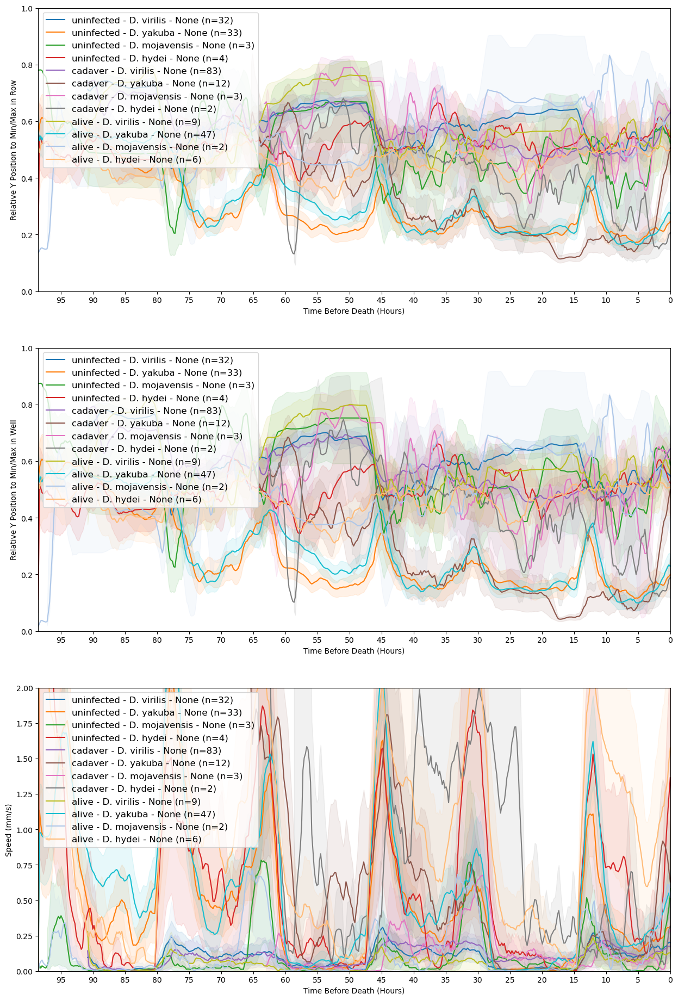

In [389]:
# Set up the plot
fig, axs = plt.subplots(3, 1, figsize=(15, 23))
fig.patch.set_facecolor(bg_color)
for ax in axs:
    ax.set_facecolor(ax_color)
    ax.tick_params(colors=tick_color)
    for spine in ax.spines.values():
        spine.set_color(spine_color)
    ax.yaxis.label.set_color(text_color)
    ax.xaxis.label.set_color(text_color)
    ax.title.set_color(text_color)

# Plot data for each subplot
plot_data(axs[0], ypos_row_graph_metrics, plot_thresh,1)
axs[0].set_ylabel("Relative Y Position to Min/Max in Row")
axs[0].set_xlabel("Time Before Death (Hours)")
axs[0].set_xticks(np.arange(0, np.ceil((len(speed_reduced.values[0]))/(3*60*60)+0), 5))
axs[0].legend(prop={"size": 12}, loc="upper left")
axs[0].set_ylim(0, 1)
axs[0].set_xlim(0, (len(speed_reduced.values[0]))/(3*60*60)+0)
axs[0].invert_xaxis()

plot_data(axs[1], ypos_well_graph_metrics, plot_thresh,1)
axs[1].set_ylabel("Relative Y Position to Min/Max in Well")
axs[1].set_xlabel("Time Before Death (Hours)")
axs[1].set_xticks(np.arange(0, np.ceil((len(speed_reduced.values[0]))/(3*60*60)), 5))
axs[1].legend(prop={"size": 12}, loc="upper left")
axs[1].set_ylim(0, 1)
axs[1].set_xlim(0, (len(speed_reduced.values[0]))/(3*60*60)+0)
axs[1].invert_xaxis()

plot_data(axs[2], speed_graph_metrics, plot_thresh,1)
axs[2].set_ylabel("Speed (mm/s)")
axs[2].set_xlabel("Time Before Death (Hours)")
axs[2].set_xticks(np.arange(0, np.ceil((len(speed_reduced.values[0]))/(3*60*60)), 5))
axs[2].legend(prop={"size": 12}, loc="upper left")
axs[2].set_ylim(0, 2)
axs[2].set_xlim(0, (len(speed_reduced.values[0]))/(3*60*60)+0)
axs[2].invert_xaxis()

if darkmode == 1:
    for ax in axs:
        leg = ax.get_legend()
        if leg:
            for text in leg.get_texts():
                text.set_color('white')
            leg.get_frame().set_facecolor('black')
            leg.get_frame().set_edgecolor('white') 

if savefigures == 1:
    if sex_seg == 0:
        if macorpc == 0:
            plt.savefig(folders[0]+"Summiting_plot.png",dpi=300)
        if macorpc == 1: 
            plt.savefig(folders[0]+'/'+"Summiting_plot.png",dpi=300)
    if sex_seg == 1:
        if macorpc == 0:
            plt.savefig(folders[0]+"Summiting_plot_sexseg.png",dpi=300)
        if macorpc == 1: 
            plt.savefig(folders[0]+'/'+"Summiting_plot_sexseg.png",dpi=300)

plt.show()


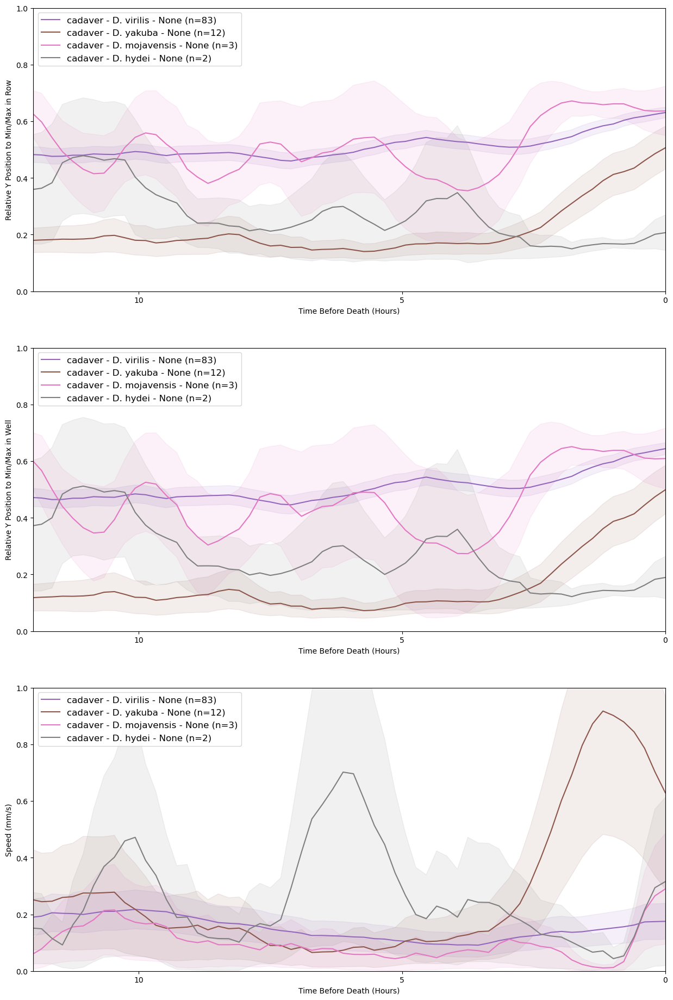

In [390]:
# Plot again, but with just the last 12 hours and cadavers only
# Set up the plot
fig, axs = plt.subplots(3, 1, figsize=(15, 23))
fig.patch.set_facecolor(bg_color)
for ax in axs:
    ax.set_facecolor(ax_color)
    ax.tick_params(colors=tick_color)
    for spine in ax.spines.values():
        spine.set_color(spine_color)
    ax.yaxis.label.set_color(text_color)
    ax.xaxis.label.set_color(text_color)
    ax.title.set_color(text_color)

# Plot data for each subplot
plot_data(axs[0], ypos_row_graph_metrics, plot_thresh, 2)
axs[0].set_ylabel("Relative Y Position to Min/Max in Row")
axs[0].set_xlabel("Time Before Death (Hours)")
axs[0].set_xticks(np.arange(0, np.ceil((len(speed_reduced.values[0]))/(3*60*60)+0), 5))
axs[0].legend(prop={"size": 12}, loc="upper left")
axs[0].set_ylim(0, 1)
axs[0].set_xlim(0, 12)
axs[0].invert_xaxis()

plot_data(axs[1], ypos_well_graph_metrics, plot_thresh, 2)
axs[1].set_ylabel("Relative Y Position to Min/Max in Well")
axs[1].set_xlabel("Time Before Death (Hours)")
axs[1].set_xticks(np.arange(0, np.ceil((len(speed_reduced.values[0]))/(3*60*60)), 5))
axs[1].legend(prop={"size": 12}, loc="upper left")
axs[1].set_ylim(0, 1)
axs[1].set_xlim(0, 12)
axs[1].invert_xaxis()

plot_data(axs[2], speed_graph_metrics, plot_thresh, 2)
axs[2].set_ylabel("Speed (mm/s)")
axs[2].set_xlabel("Time Before Death (Hours)")
axs[2].set_xticks(np.arange(0, np.ceil((len(speed_reduced.values[0]))/(3*60*60)), 5))
axs[2].legend(prop={"size": 12}, loc="upper left")
axs[2].set_ylim(0, 1)
axs[2].set_xlim(0, 12)
axs[2].invert_xaxis()

if darkmode == 1:
    for ax in axs:
        leg = ax.get_legend()
        if leg:
            for text in leg.get_texts():
                text.set_color('white')
            leg.get_frame().set_facecolor('black')
            leg.get_frame().set_edgecolor('white') 

if savefigures == 1:
    if sex_seg == 0:
        if macorpc == 0:
            plt.savefig(folders[0]+"Summiting_plot_last12hours.png",dpi=150)
        if macorpc == 1: 
            plt.savefig(folders[0]+'/'+"Summiting_plot_last12hours.png",dpi=150)
    if sex_seg == 1:
        if macorpc == 0:
            plt.savefig(folders[0]+"Summiting_plot_last12hours_sexseg.png",dpi=150)
        if macorpc == 1: 
            plt.savefig(folders[0]+'/'+"Summiting_plot_last12hours_sexseg.png",dpi=150)

plt.show()

## Optional: plot certain conditions individually

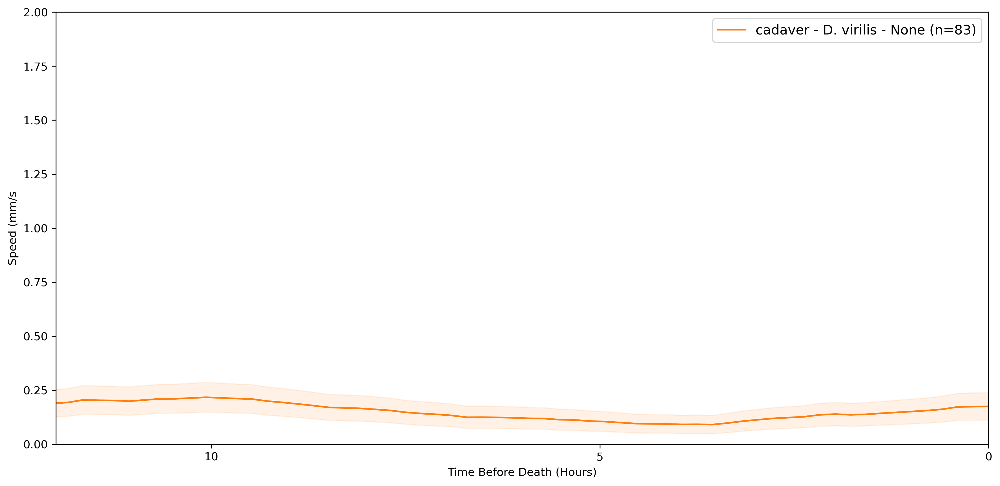

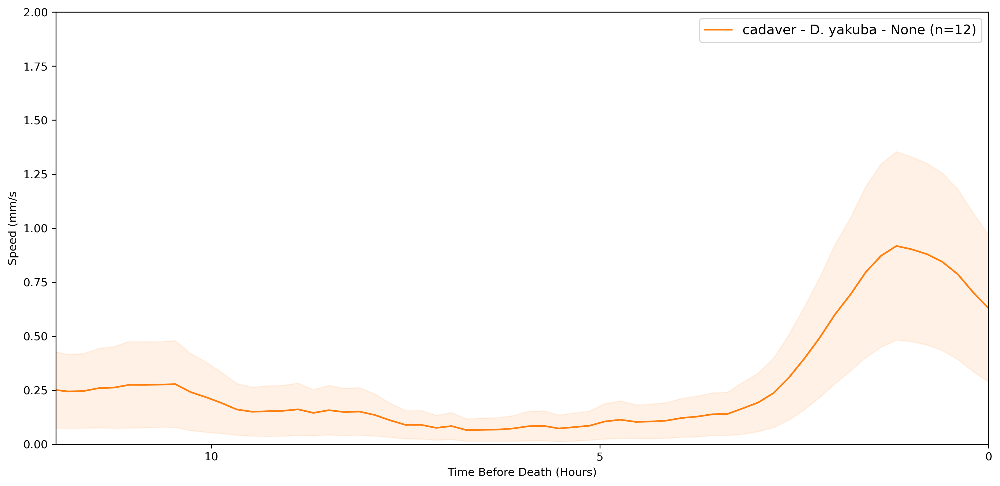

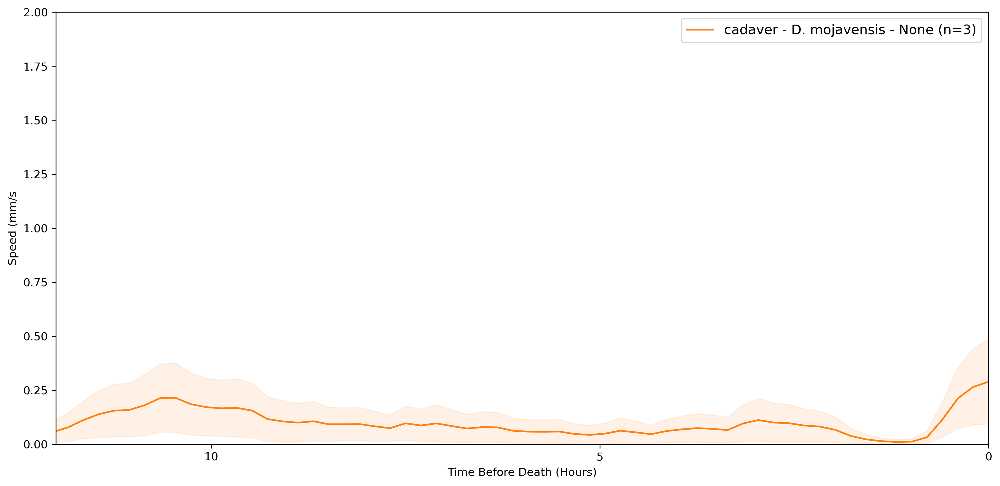

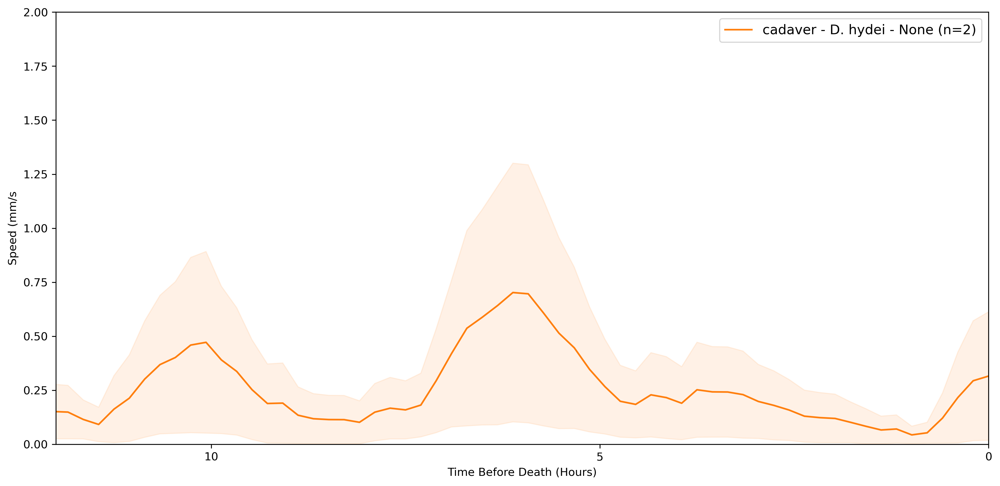

In [391]:
# plot each group (AS DEFINED BY THE USER!) individually
depth = int(input("What variable do you want to split your graph up by?\n1: Infection Status\n2: Genotype\n3: Sex\n4: Primary Condition (if applicable)\n5: Secondary Condition (if applicable)\n"))
what_to_plot = int(input("What variable(s) do you want to plot?\n1: Speed\n2: Ypos (by row)\n3: Ypos (by well)\n4: All three\n"))
zoomed_plot = int(input("Do you want to plot the last 12 hours only? (0: No, 1: Yes)\n"))
cadaver_plot = int(input("Do you want to plot cadavers only? (0: No, 1: Yes)\n"))

sectioned_ypos_row = group_by_lower_level_as_list(ypos_row_graph_metrics, depth)
sectioned_ypos_well = group_by_lower_level_as_list(ypos_well_graph_metrics, depth)
sectioned_speed = group_by_lower_level_as_list(speed_graph_metrics, depth)

for split in range(len(sectioned_speed)):
    if cadaver_plot == 1:
        cadaver = 2
    else:
        cadaver = 1
    if zoomed_plot == 1:
        xlimit = 12
    else:
        xlimit = (len(speed_reduced.values[0]))/(3*60*60)+0

    # define figure and axes
    if what_to_plot == 4:
        fig, axs = plt.subplots(3, 1, figsize=(15, 23))
    else:
        fig, axs = plt.subplots(1, 1, figsize=(15, 7),dpi=300)
        if not isinstance(axs, np.ndarray):
            axs = np.array([axs])

    # set plot colors
    fig.patch.set_facecolor(bg_color)
    for ax in axs:
        ax.set_facecolor(ax_color)
        ax.tick_params(colors=tick_color)
        for spine in ax.spines.values():
            spine.set_color(spine_color)
        ax.yaxis.label.set_color(text_color)
        ax.xaxis.label.set_color(text_color)
        ax.title.set_color(text_color)

    if what_to_plot == 1:
        # plot data for speed
        plot_data(axs[0], sectioned_speed[split], plot_thresh,cadaver)
        axs[0].set_ylabel("Speed (mm/s")
        axs[0].set_xlabel("Time Before Death (Hours)")
        axs[0].set_xticks(np.arange(0, np.ceil((len(speed_reduced.values[0]))/(3*60*60)+0), 5))
        axs[0].legend(prop={"size": 12}, loc="upper right")
        axs[0].set_ylim(0, 2)
        axs[0].set_xlim(0, xlimit)
        axs[0].invert_xaxis()

        if darkmode == 1:
            for ax in axs:
                leg = ax.get_legend()
                if leg:
                    for text in leg.get_texts():
                        text.set_color('white')
                    leg.get_frame().set_facecolor('black')
                    leg.get_frame().set_edgecolor('white') 

        if savefigures == 1:
            if macorpc == 0:
                plt.savefig(folders[0]+f"{nth_nested_key(sectioned_speed[split], depth)}_Summiting_Speed_plot.png",dpi=300)
            if macorpc == 1: 
                plt.savefig(folders[0]+'/'+f"{nth_nested_key(sectioned_speed[split], depth)}_Summiting_Speed_plot.png",dpi=300)

        plt.show()
    if what_to_plot == 2:
        # plot data for ypos by row
        plot_data(axs[0], sectioned_ypos_row[split], plot_thresh,cadaver)
        axs[0].set_ylabel("Relative Y Position to Min/Max in Row")
        axs[0].set_xlabel("Time Before Death (Hours)")
        axs[0].set_xticks(np.arange(0, np.ceil((len(speed_reduced.values[0]))/(3*60*60)+0), 5))
        axs[0].legend(prop={"size": 12}, loc="upper right")
        axs[0].set_ylim(0, 1)
        axs[0].set_xlim(0, xlimit)
        axs[0].invert_xaxis()

        if darkmode == 1:
            for ax in axs:
                leg = ax.get_legend()
                if leg:
                    for text in leg.get_texts():
                        text.set_color('white')
                    leg.get_frame().set_facecolor('black')
                    leg.get_frame().set_edgecolor('white')

        if savefigures == 1:
            if macorpc == 0:
                plt.savefig(folders[0]+f"{nth_nested_key(sectioned_speed[split], depth)}_Summiting_Yposrow_plot.png",dpi=300)
            if macorpc == 1: 
                plt.savefig(folders[0]+'/'+f"{nth_nested_key(sectioned_speed[split], depth)}_Summiting_Yposrow_plot.png",dpi=300)

        plt.show()
    if what_to_plot == 3:
        # plot data for ypos by well
        plot_data(axs[0], sectioned_ypos_well[split], plot_thresh,cadaver)
        axs[0].set_ylabel("Relative Y Position to Min/Max in Well")
        axs[0].set_xlabel("Time Before Death (Hours)")
        axs[0].set_xticks(np.arange(0, np.ceil((len(speed_reduced.values[0]))/(3*60*60)+0), 5))
        axs[0].legend(prop={"size": 12}, loc="upper right")
        axs[0].set_ylim(0, 1)
        axs[0].set_xlim(0, xlimit)
        axs[0].invert_xaxis()

        if darkmode == 1:
            for ax in axs:
                leg = ax.get_legend()
                if leg:
                    for text in leg.get_texts():
                        text.set_color('white')
                    leg.get_frame().set_facecolor('black')
                    leg.get_frame().set_edgecolor('white')

        if savefigures == 1:
            if macorpc == 0:
                plt.savefig(folders[0]+f"{nth_nested_key(sectioned_speed[split], depth)}_Summiting_Yposwell_plot.png",dpi=300)
            if macorpc == 1: 
                plt.savefig(folders[0]+'/'+f"{nth_nested_key(sectioned_speed[split], depth)}_Summiting_Yposwell_plot.png",dpi=300)

        plt.show()
    if what_to_plot == 4:
        # plot data for ypos by row
        plot_data(axs[0], sectioned_ypos_row[split], plot_thresh,cadaver)
        axs[0].set_ylabel("Relative Y Position to Min/Max in Row")
        axs[0].set_title("Y Position by Row")
        axs[0].set_xlabel("Time Before Death (Hours)")
        axs[0].set_xticks(np.arange(0, np.ceil((len(speed_reduced.values[0]))/(3*60*60)+0), 5))
        axs[0].legend(prop={"size": 12}, loc="upper right")
        axs[0].set_ylim(0, 1)
        axs[0].set_xlim(0, xlimit)
        axs[0].invert_xaxis()

        # plot data for ypos by well
        plot_data(axs[1], sectioned_ypos_well[split], plot_thresh,cadaver)
        axs[1].set_ylabel("Relative Y Position to Min/Max in Well")
        axs[1].set_title("Y Position by Well")
        axs[1].set_xlabel("Time Before Death (Hours)")
        axs[1].set_xticks(np.arange(0, np.ceil((len(speed_reduced.values[0]))/(3*60*60)+0), 5))
        axs[1].legend(prop={"size": 12}, loc="upper right")
        axs[1].set_ylim(0, 1)
        axs[1].set_xlim(0, xlimit)
        axs[1].invert_xaxis()

        # plot data for speed
        plot_data(axs[2], sectioned_speed[split], plot_thresh,cadaver)
        axs[2].set_ylabel("Speed (mm/s)")
        axs[2].set_title("Speed")
        axs[2].set_xlabel("Time Before Death (Hours)")
        axs[2].set_xticks(np.arange(0, np.ceil((len(speed_reduced.values[0]))/(3*60*60)+0), 5))
        axs[2].legend(prop={"size": 12}, loc="upper right")
        axs[2].set_ylim(0, 2)
        axs[2].set_xlim(0, xlimit)
        axs[2].invert_xaxis()

        if darkmode == 1:
            for ax in axs:
                leg = ax.get_legend()
                if leg:
                    for text in leg.get_texts():
                        text.set_color('white')
                    leg.get_frame().set_facecolor('black')
                    leg.get_frame().set_edgecolor('white')

        if savefigures == 1:
            if macorpc == 0:
                plt.savefig(folders[0]+f"{nth_nested_key(sectioned_speed[split], depth)}_Summiting_plot.png",dpi=300)
            if macorpc == 1: 
                plt.savefig(folders[0]+'/'+f"{nth_nested_key(sectioned_speed[split], depth)}_Summiting_plot.png",dpi=300)

        plt.show()


# Plot cadaver death distribution

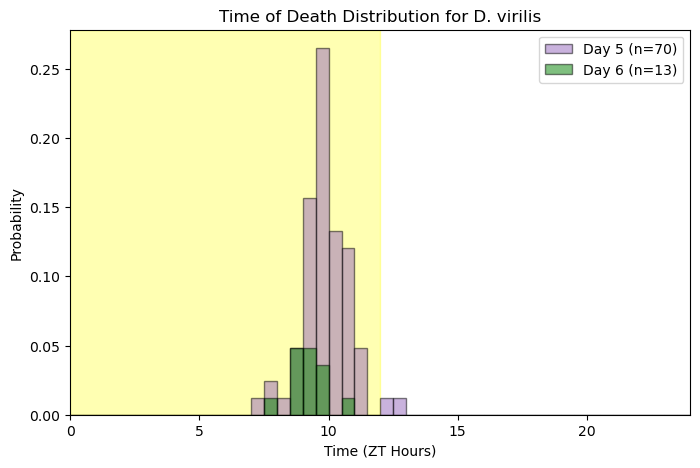

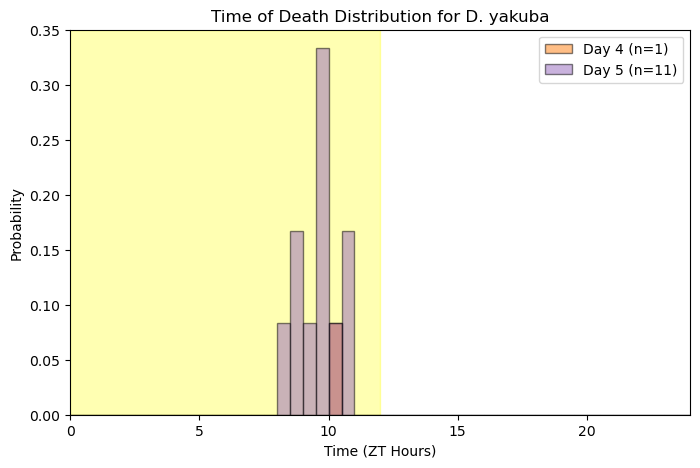

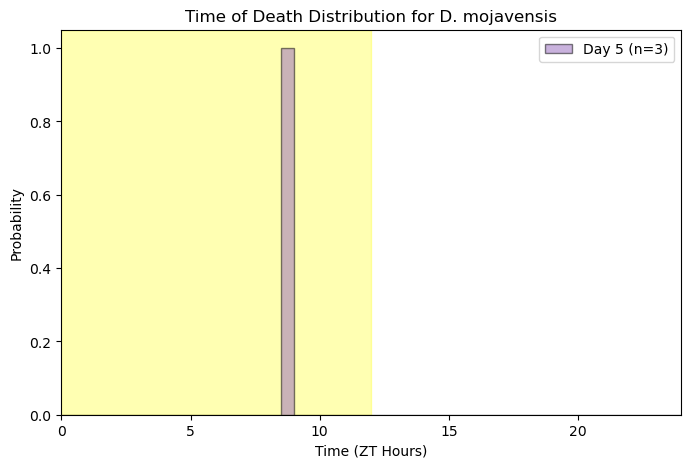

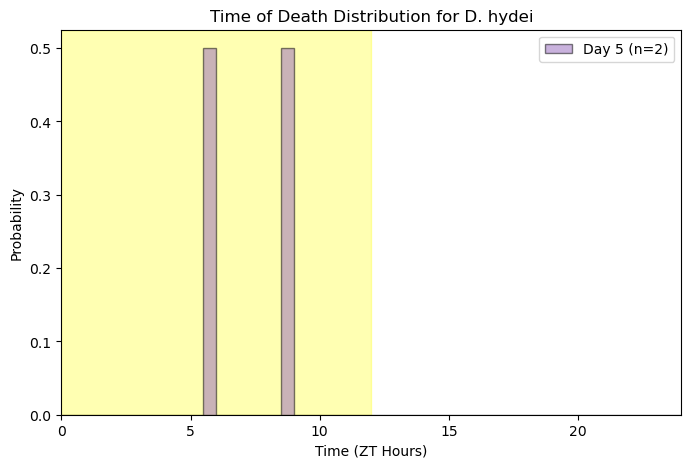

In [392]:
# pull out just the cadavers for each group and plot a histogram of time of death
cadavers_only_TODs = TODs_reduced_all_comp[(TODs_reduced_all_comp['Status'] == 0) & (TODs_reduced_all_comp['Rx'] != 'Uninfected')].reset_index(drop=True)
cadavers_only_TODs['Blind_TOD_adj'] = (cadavers_only_TODs["Blind_TOD"]/(3*60*60))+start_time_hr-ZT0 # puts it in hours
cadavers_only_TODs['Day'] = (cadavers_only_TODs['Blind_TOD_adj'] // 24).astype(int) + start_day # finds the day of death
cadavers_only_TODs['Hour_of_Death'] = cadavers_only_TODs['Blind_TOD_adj'] % 24 

# split by condition
genos = cadavers_only_TODs['Geno'].unique()

for geno in genos:
    df_geno = cadavers_only_TODs[cadavers_only_TODs['Geno'] == geno]
    plot_specs = []
    if sex_seg == 1:
        plot_specs.append('Sex')
    if prim_cond == 1:
        plot_specs.append('Condition')
    if sec_cond == 1:
        plot_specs.append('Condition_alt')
    if len(plot_specs) == 0:
        plot_specs = None

    # define plot colors
    day_colors = {
        3: '#1f77b4',
        4: '#ff7f0e',
        5: '#9467bd',
        6: '#008000',
        7: '#d62728',
        #9467bd
    }

    # plot it!
    bins = np.arange(0, 25, 0.5)  # 30 min bins

    if plot_specs is None:
        groups = [("All", df_geno)]
    else:
        groups = df_geno.groupby(plot_specs)
    
    for name, df_sub in groups:
        fig, ax = plt.subplots(figsize=(8, 5))
        fig.patch.set_facecolor(bg_color)
        ax.set_facecolor(ax_color)
        ax.tick_params(colors=tick_color)
        for spine in ax.spines.values():
            spine.set_color(spine_color)
        ax.yaxis.label.set_color(text_color)
        ax.xaxis.label.set_color(text_color)
        ax.title.set_color(text_color)
            
        title_parts = [f"{geno}"]
        if plot_specs is not None:
            title_parts = ", ".join(str(x).strip() for x in name)
        else:
            title_parts = ""
        for day in sorted(df_sub['Day'].unique()):
            data = df_sub.loc[
                df_sub['Day'] == day,
                'Hour_of_Death'
            ]
            ax.hist(
                data,
                bins=bins,
                alpha=0.5,
                weights=np.ones(len(data)) / len(df_sub),
                label=f'Day {day} (n={len(data)})',
                edgecolor=spine_color,
                color=day_colors.get(day, 'black')
            )

        # plot light cycle
        ymax = ax.get_ylim()[1]
        ax.fill_betweenx((0, ymax), 0, 0 + ontime, color=light_fill, alpha=light_alpha,zorder=0) 

        if plot_specs is not None:
            ax.set_title(f'Time of Death Distribution for {geno}, {title_parts}')
        else:
            ax.set_title(f'Time of Death Distribution for {geno}')
        ax.set_xlabel('Time (ZT Hours)')
        ax.set_ylabel('Probability')
        ax.set_xlim(0, 24)
        ax.set_ylim(0, ymax)
        ax.legend()

        if darkmode == 1:
            for ax in axs:
                leg = ax.get_legend()
                if leg:
                    for text in leg.get_texts():
                        text.set_color('white')
                    leg.get_frame().set_facecolor('black')
                    leg.get_frame().set_edgecolor('white') 


        if savefigures == 1:
            if macorpc == 0:
                plt.savefig(folders[0]+f"{geno}_{'_'.join(str(x).strip() for x in name)}_TOD_Hist.png",dpi=300)
            if macorpc == 1: 
                plt.savefig(folders[0]+'/'+f"{geno}_{'_'.join(str(x).strip() for x in name)}_TOD_Hist.png",dpi=300)
    
        plt.show()